In [1]:
import glob
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd 
pd.options.mode.chained_assignment = None
import numpy as np
import h5py
import hdf5plugin
import ray
import pickle
import multiprocessing
from functools import partial
import matplotlib.pyplot as plt
import os, sys

from collections import Counter
from scipy.interpolate import interp1d


sys.path.append(os.getcwd()+'/../../public/cds-backend/code/')
import cds_eua4 as eua

!module load odc
import pyodc
# import codc

from scipy.stats import linregress

import csv

# Ray setup with 40 cores:
# ray.init(num_cpus=40)


/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-05-22 10:14:10,083	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


no config found
Loading odc/1.4.5-gcc-11.3.0-avoxopw
  Loading requirement: openmpi/4.0.5-gcc-11.3.0-pob76hu
    eckit/1.24.4-gcc-11.3.0-jxjc4by
>

In [2]:
def find_closest_date(dates, target):
    return dates.loc[(dates - target).abs().idxmin()]

def calculate_pressure_layered(p0, L, T, z, R=287.053, g=9.80665):
    """
    Calculate the pressure (p) layer by layer for a given atmosphere model.
    
    Parameters:
    - p0: float, pressure at the start of the first layer (in Pascals)
    - L: list of float, temperature lapse rates for each layer (in K/m)
    - z: list of float, thickness of each layer (in meters)
    - T: list of float, temperature at the start of each layer (in Kelvin)
    - R: float, specific gas constant for dry air (default: 287.053 J/(kg·K))
    - g: float, acceleration due to gravity (default: 9.80665 m/s²)
    
    Returns:
    - list of float, pressures at the end of each layer
    """
    p_out = [] 

    exponent = g / (L * R) 

    for i in range(len(z)):
        if i == 0:
            p_out.append(p0)
        else:
            if np.abs(L[i]) > 0.001:  # If L is non-zero, use the polytropic formula
                p_next = p_out[i-1] * (1 - (L[i] * (z[i] - z[i-1])) / (T[i])) ** exponent[i]
            else:  # If L close to 0, use the isothermal layer formula
                p_next = p_out[i-1] * np.exp(-g * (z[i] - z[i-1]) / (R * T[i-1]))
            p_out.append(p_next)
    
    return p_out

def z_to_p_ifs(h): # geopotential height (m^/s^2) to pressure (Pa)
    a = 5.252368255329
    b = 44330.769230769
    c = 0.000157583169442
    ptro = 226.547172
    po = 1013.25
    g = 9.80665
 
    h /= g
    if h != h:

        p = h

    elif h > 11000.0:

        y = -c * (h - 11000.0)

        p = ptro * np.exp(y)

    else:

        y = 1.0 - h / b

        p = po * (y**a)

    return p * 100. # we want Pa

def p_to_z_ifs(p): # pressure (hPa) to geopotential height (m^/s^2) 
    a = 5.252368255329
    b = 44330.769230769
    c = 0.000157583169442
    ptro = 226.547172
    po = 1013.25
    g = 9.80665
 
    if p != p:

        h = p

    elif p < 226.5:
        
        y = np.log(p/ptro)

        h = y /(-c) + 11000.

    else:
        
        y = (p / po) ** (1. / a)
        
        h = (y - 1) * (-b)


    h *= g
    return h



def geopotential_to_pressure(P1, Z1, Z2, Tm):
    """Convert geopotential height and temperature to pressure.
    
    Parameters:
        P1 (float): Pressure at height Z1 (Pa)
        Z1 (float): Geopotential height at P1 (m)
        Z2 (float): Geopotential height at P2 (m)
        Tm (float): Mean temperature between Z1 and Z2 (K)
    
    Returns:
        float: Estimated pressure at Z2 (Pa)
    """
    g = 9.80665  # Gravity (m/s²)
    R = 287.05   # Specific gas constant for dry air (J/kg·K)
    
    # Compute pressure at Z2 using the hypsometric equation
    P2 = P1 * np.exp(-g * (Z2 - Z1) / (R * Tm))
    
    return P2

def compute_pressure_profile(temperature, geopotential, P_surface):
    """Compute pressure profile from temperature and geopotential arrays.
    
    Parameters:
        temperature (array-like): Temperature at different heights (K)
        geopotential (array-like): Corresponding geopotential heights (m)
        P_surface (float): Surface pressure (Pa)
    
    Returns:
        np.ndarray: Computed pressure values at each geopotential height.
    """
    temperature = np.array(temperature)
    geopotential = np.array(geopotential)
    
    pressures = np.zeros_like(geopotential)  # Initialize pressure array
    pressures[0] = P_surface  # Set surface pressure
    
    for i in range(1, len(geopotential)):
        # Compute mean temperature in the layer
        Tm = (temperature[i] + temperature[i - 1]) / 2.0  
        
        # Compute pressure at height Z[i]
        pressures[i] = geopotential_to_pressure(pressures[i - 1], geopotential[i - 1], geopotential[i], Tm)
    
    return pressures

In [3]:
# @ray.remote
def find_pilot(file):
    with h5py.File(file) as fl:
        x = np.unique(fl['era5fb']['reportype'][:])
        if (16068 in x or 16013 in x and np.abs(fl['header_table']['latitude'][-1]) <= 35):
            print(x, file)
            return file


for year in [1985]: # range(1900,2025,1): # [1985]: #
    print(year)
    file_list = []
    # files = glob.glob('/mnt/users/scratch/leo/scratch/converted_v29/'+str(year)+'/*.nc') # *-0-94*
    files = glob.glob('/mnt/users/scratch/leo/scratch/converted_v29/'+str(year)+'/*-0-94*.nc') #

    for i in files:
        file_list.append(find_pilot(i))

file_list = [i for i in file_list if i != None]


1985
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94150_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94174_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94287_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94367_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94476_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94380_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94212_CEUAS_merged_v3.nc
[-2147483648       16013       16022] /mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94294_CEUAS_merged_v3.nc
[-214748364

In [4]:
# from collections import defaultdict

# # Function to process individual file
# def find_pilot(file):
#     r_temp = 0
#     r_pilot = 0
#     with h5py.File(file, 'r') as fl:
#         x = fl['era5fb']['reportype'][:]
#         xx = np.unique(x, return_counts=True)
#         pilot = 0
#         temp = 0

#         if 16068 in xx[0]:
#             pilot += int(xx[1][xx[0] == 16068])
#         if 16013 in xx[0]:
#             pilot += int(xx[1][xx[0] == 16013])

#         if 16022 in xx[0]:
#             temp += int(xx[1][xx[0] == 16022])
#         if 16045 in xx[0]:
#             temp += int(xx[1][xx[0] == 16045])
        
#     if pilot >= 50:
#         r_pilot = 1
#     if temp >= 50:
#         r_temp = 1
#     return [r_temp, r_pilot]

# # Function to process individual file -> second option
# def find_pilot(file):
#     with h5py.File(file, 'r') as fl:
#         x = fl['observations_table']['observed_variable'][:]
#         y = fl['observations_table']['report_id'][:]
        
#     # Group observed variables by report_id
#     report_vars = defaultdict(set)

#     for var, rid in zip(x, y):
#         rid = b"".join(rid).decode("utf-8").strip()
#         report_vars[rid].add(var)

#     temp = 0
#     pilot = 0

#     for vars in report_vars.values():
#         if 126 in vars:
#             temp += 1
#         else:
#             pilot += 1

#     # Convert counts into binary indicators (as in your original version)
#     r_temp = int(temp >= 50)
#     r_pilot = int(pilot >= 50)

#     return [r_temp, r_pilot]

# # Ray-remote version of yearly processing
# @ray.remote
# def process_year(year):
#     print(f'Starting {year}!')
#     temp_sum = 0
#     pilot_sum = 0
#     files = glob.glob(f'/mnt/users/scratch/leo/scratch/converted_v29/{year}/*.nc')
    
#     for file in files:
#         r_temp, r_pilot = find_pilot(file)
#         temp_sum += r_temp
#         pilot_sum += r_pilot
    
#     return year, temp_sum, pilot_sum

# # Process years in parallel
# years = list(range(1900, 2026))
# futures = [process_year.remote(year) for year in years]
# results = ray.get(futures)

# # Sort results by year
# results.sort()

# # Extract counts
# temp_counts = [res[1] for res in results]
# pilot_counts = [res[2] for res in results]

# # Save results to CSV
# with open("yearly_station_counts_obsvar.csv", "w", newline="") as f:
#     writer = csv.writer(f)
#     writer.writerow(["Year", "Temp_Station_Count", "Pilot_Station_Count"])
#     writer.writerows(results)


In [5]:
def plot_station_counts_from_file(csv_path='yearly_station_counts.csv'):
    years = []
    temp_counts = []
    pilot_counts = []

    # Read data from CSV
    with open(csv_path, newline='') as f:
        reader = csv.DictReader(f)
        for row in reader:
            years.append(int(row['Year']))
            temp_counts.append(int(row['Temp_Station_Count']))
            pilot_counts.append(int(row['Pilot_Station_Count']))

    x = np.arange(len(years))
    bar_width = 0.8

    # Make the plot
    plt.figure(figsize=(12, 8))  # Twice the default size
    plt.bar(x, pilot_counts, color='blue', label='Pilot Stations', width=bar_width)
    plt.bar(x, temp_counts, bottom=pilot_counts, color='orange', label='Temp Stations', width=bar_width)

    # Labels and formatting
    plt.xlabel('Year')
    plt.ylabel('Count')
    plt.title('Yearly Counts of Pilot and Temp Stations')
    plt.xticks(x[::10], [str(year) for year in years][::10], rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


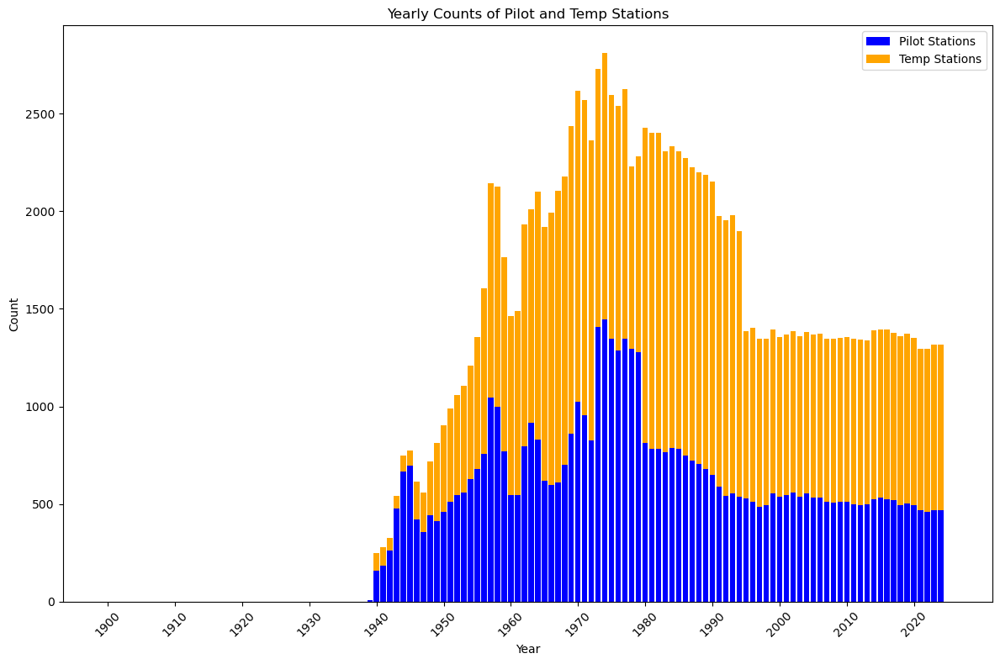

In [6]:
# From era5fb ascent type
plot_station_counts_from_file('yearly_station_counts.csv')


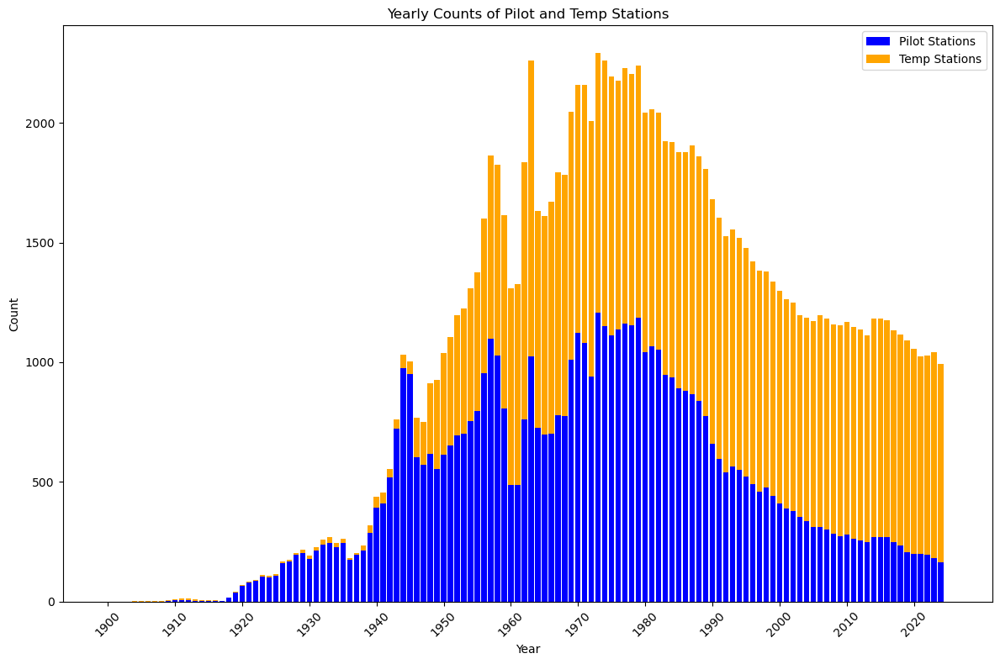

In [7]:
# From observatons, where 126 was either available or not
plot_station_counts_from_file('yearly_station_counts_obsvar.csv')


In [8]:
def plot_observation_counts_from_file(csv_path='yearly_station_counts.csv'):
    years = []
    temp_counts = []
    pilot_counts = []

    # Read data from CSV
    with open(csv_path, newline='') as f:
        reader = csv.DictReader(f)
        for row in reader:
            years.append(int(row['Year']))
            temp_counts.append(int(row['Temp_Station_Count']))
            pilot_counts.append(int(row['Pilot_Station_Count']))

    x = np.arange(len(years))
    bar_width = 0.8

    # Make the plot
    plt.figure(figsize=(12, 8))  # Twice the default size
    plt.bar(x, pilot_counts, color='blue', label='Pilot Observation', width=bar_width)
    plt.bar(x, temp_counts, bottom=pilot_counts, color='orange', label='Temp Observation', width=bar_width)

    # Labels and formatting
    plt.xlabel('Year')
    plt.ylabel('Count')
    plt.title('Yearly Counts of Pilot and Temp Observations')
    plt.xticks(x[::10], [str(year) for year in years][::10], rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


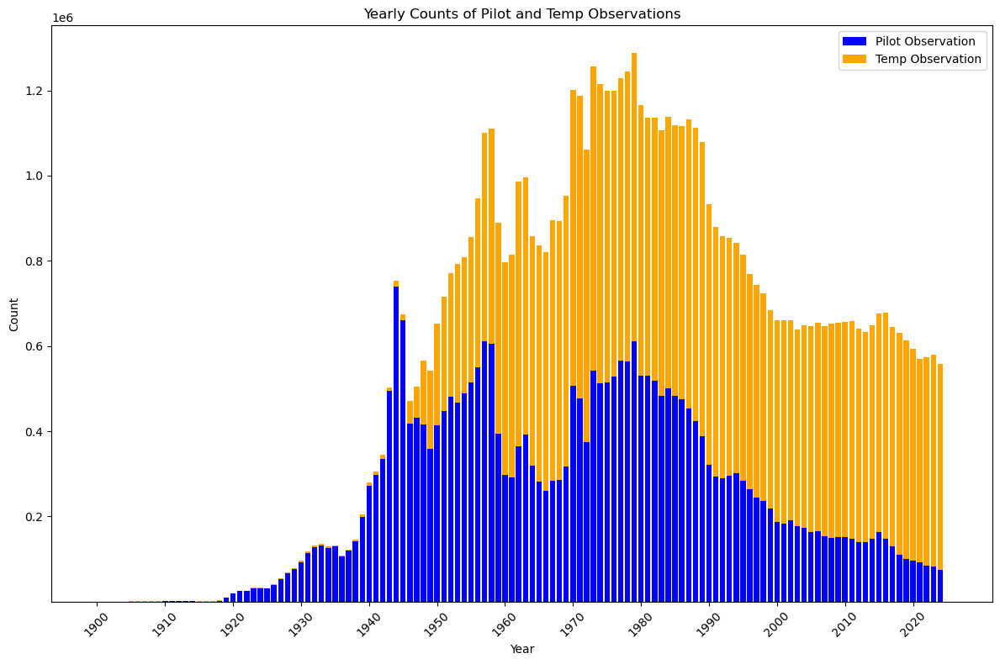

In [9]:
# From observatons, where 126 was either available or not
plot_observation_counts_from_file('yearly_observation_counts_obsvar.csv')

In [10]:
# Histogram
# Plot of mean winds in 200 - 400 hPa for each of ifs and also the other winds. -> map plot.

In [11]:
# ## With gradient limit

# g = 9.80665

# for cfile in file_list[:10]:
#     cdmfile = eua.CDMDataset(cfile)
#     # display(cdmfile.station_configuration.secondary_id[:])
#     df = cdmfile.to_dataframe(groups = ['observations_table', 'era5fb'], variables= ['date_time', 'observation_value', 'observed_variable', 'z_coordinate', 'z_coordinate_type','latitude', 'longitude', 'sensor_id', 'observation_height_above_station_surface', 'reportype', 'fg_depar@offline', 'fg_depar@body']) # 

#     rs_df = df[df.reportype == 16022]
#     pilot_df = df[df.reportype == 16013]

#     rs_df_piv = rs_df.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()
#     pilot_df_piv = pilot_df.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()

#     pilot_df_fg = pilot_df
#     pilot_df_fg['observation_value'] = pilot_df_fg['observation_value'] - pilot_df_fg['fg_depar@body'] # body or offline
#     pilot_df_piv_fg = pilot_df_fg.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()

#     fg_std = np.nanstd(pilot_df_fg[np.logical_and(pilot_df_fg.date_time == '1985-11-10 17:30:00', pilot_df_fg.observed_variable == 139)]['fg_depar@body'])


#     pilot_df_piv['u_fg'] = pilot_df_piv_fg[139]
#     pilot_df_piv['v_fg'] = pilot_df_piv_fg[140]
    
#     # test_df = pilot_df_piv[pilot_df_piv.date_time == pilot_df_piv.date_time.iloc[0]]
#     # plt.scatter(test_df[139], test_df['z_coordinate'], 10, label='obs')
#     # plt.scatter(test_df['u_fg'], test_df['z_coordinate'], 10, label='fg')
#     # plt.gca().invert_yaxis()
#     # plt.legend()
#     # plt.show()
#     # plt.close()


#     z_for_diff = []
#     gp_diff = []
#     z_for_diff_poly = []
#     gp_diff_poly = []

#     wind_p = []
#     u_diff = []
#     v_diff = []
#     u_diff_poly = []
#     v_diff_poly = []

#     u_wofg = []
#     v_wofg = []
#     u_poly_wofg = []
#     v_poly_wofg = []


#     match_days = 0
#     for year in [1985]:
#         for month in range(1,2): ## 13 !!!!
#             for day in range(1,32):
#                 # if match_days > 0:
#                 #     continue
#                 try:
#                     # rs_day = rs_df[rs_df.date_time == str(year) + '-' + str(month) + '-' + str(day)]
#                     try:
#                         pilot_day_piv = pilot_df_piv[np.logical_and(pilot_df_piv.date_time >= pd.to_datetime(f"{year}-{month}-{day} 00:00:00") , (pilot_df_piv.date_time <= pd.to_datetime(f"{year}-{month}-{day} 23:59:59")))]
#                     except:
#                         continue
#                     surf_gp = []
#                     surf_dt = []
#                     for i in pilot_day_piv.date_time.drop_duplicates():
#                         pilot_asc_piv = pilot_day_piv[pilot_day_piv.date_time == i]
#                         # print('Pilot GP: ', list(pilot_asc_piv[117]))
#                         pilot_asc_piv['z_coordinate'] = np.log(pilot_asc_piv['z_coordinate'])
#                         pilot_asc_piv[117] = pilot_asc_piv.sort_values("z_coordinate")[117].interpolate(method="linear")
#                         pilot_asc_piv['z_coordinate'] = np.exp(pilot_asc_piv['z_coordinate'])
#                         pilot_asc_piv.dropna(subset=117, inplace=True)
#                         # print('Pilot GP after interp: ', list(pilot_asc_piv[117]))
#                         pilot_asc = pilot_asc_piv

#                         best_match = pd.merge_asof(pilot_asc, rs_df_piv, on='date_time', direction='nearest', tolerance=pd.Timedelta('12H'))
#                         rs_match = rs_df_piv[rs_df_piv.date_time == best_match.date_time.iloc[0]]
#                         rs_match['z_coordinate'] = np.log(rs_match['z_coordinate'])
#                         rs_match[117] = rs_match.sort_values("z_coordinate")[117].interpolate(method="linear")
#                         rs_match['z_coordinate'] = np.exp(rs_match['z_coordinate'])

#                         pilot_asc["date_time"] = pilot_asc["date_time"].dt.strftime("%Y-%m-%d %H:%M:%S")
#                         rs_match["date_time"] = rs_match["date_time"].dt.strftime("%Y-%m-%d %H:%M:%S")


#                         if len(rs_match) != 0 and len(pilot_asc) != 0: # 
                            
#                             grad_test_df = pilot_asc.dropna(subset=[107, 'z_coordinate'])
#                             grad_test_df = grad_test_df[grad_test_df.z_coordinate >= 20000]
#                             # grad = np.gradient(grad_test_df[107], grad_test_df.z_coordinate)
#                             print('Slope ws: ', linregress(grad_test_df[107], grad_test_df.z_coordinate)[0])
#                             print('Slope u: ', linregress(grad_test_df[139], grad_test_df.z_coordinate)[0])
#                             print('Slope v: ', linregress(grad_test_df[140], grad_test_df.z_coordinate)[0])

#                             plt.plot(grad_test_df[107], grad_test_df.z_coordinate, label='ws')
#                             plt.plot(grad_test_df[139], grad_test_df.z_coordinate, label='u')
#                             plt.plot(grad_test_df[140], grad_test_df.z_coordinate, label='v')
#                             plt.gca().invert_yaxis()
#                             plt.grid()
#                             plt.legend()
#                             plt.show()
#                             plt.close()
                            
#                             z_pilot = np.array(pilot_asc.z_coordinate)
#                             gp_pilot = np.array(pilot_asc[117]) # np.array(pilot_asc.observation_value)
#                             z_rs = np.array(rs_match.z_coordinate)
#                             gp_rs = np.array(rs_match[117]) # np.array(rs_match.observation_value)

#                             calc_gp_rs_to_pilot = np.interp(z_pilot, z_rs, gp_rs)
#                             z_for_diff.extend(list(z_pilot))
#                             gp_diff.extend(list(gp_pilot - calc_gp_rs_to_pilot))

#                             pasc_reverse = pilot_asc.iloc[::-1]
#                             rs_reverse = rs_match.iloc[::-1]
#                             T = np.interp(np.array(pasc_reverse[117]), np.array(rs_reverse[117]), np.array(rs_reverse[126])) # np.array(rs_reverse.observation_value), np.array(rs_reverse.temperature))
#                             p_ifs = [z_to_p_ifs(pi) for pi in pasc_reverse[117]]
#                             p_poly = np.flip(compute_pressure_profile(T, pasc_reverse[117] / g, p_ifs[0]))

#                             calc_gp_rs_to_pilot = np.interp(p_poly, z_rs, gp_rs)
#                             z_for_diff_poly.extend(list(p_poly))
#                             gp_diff_poly.extend(list(gp_pilot - calc_gp_rs_to_pilot))
#                             pilot_asc['p_poly'] = p_poly
                            
#                             pilot_asc_clear = pilot_asc.dropna()

#                             wind_p.extend(list(pilot_asc_clear['z_coordinate']))

#                             u_diff.extend(list(pilot_asc_clear[139] - pilot_asc_clear['u_fg']))
#                             v_diff.extend(list(pilot_asc_clear[140] - pilot_asc_clear['v_fg']))

#                             u_wofg.extend(list(pilot_asc_clear[139]))
#                             v_wofg.extend(list(pilot_asc_clear[140]))

#                             shifted_u = np.interp(pilot_asc_clear['p_poly'], pilot_asc_clear['z_coordinate'], pilot_asc_clear[139])
#                             shifted_v = np.interp(pilot_asc_clear['p_poly'], pilot_asc_clear['z_coordinate'], pilot_asc_clear[140])

#                             u_diff_poly.extend(list(shifted_u - pilot_asc_clear['u_fg']))
#                             v_diff_poly.extend(list(shifted_v - pilot_asc_clear['v_fg']))

#                             u_poly_wofg.extend(list(shifted_u))
#                             v_poly_wofg.extend(list(shifted_v))
                            
#                             match_days += 1
#                             surf_gp.append(pilot_asc[117].iloc[-1])
#                             surf_dt.append(i)


#                 except:
#                     pass

    
#     print(cfile)
#     print(rs_df_piv.dropna(subset=[139, 140]).keys())
#     print(pilot_df_piv.dropna(subset=[139, 140]).keys())
#     print('lat: ', cdmfile.header_table.latitude[-1], ' lon: ', cdmfile.header_table.longitude[-1])
#     if match_days > 0:

#         mask = ~np.isnan(gp_diff)
#         plt.hist2d(np.array(gp_diff)[mask], np.array(z_for_diff)[mask], bins=[30,30], cmap='viridis')
#         plt.gca().invert_yaxis()
#         plt.colorbar()
#         plt.show()
#         plt.close()

#         print("Found ascents where both (pilot and rs) are available: ", match_days)

#         fig, axes = plt.subplots(1, 3, figsize=(15, 5))

#         axes[0].scatter(gp_diff, z_for_diff, s=20, label="ifs")
#         axes[0].scatter(gp_diff_poly, z_for_diff_poly, s=10, label="polytrop")
#         axes[0].set_title('Geopotential difference')
#         axes[0].set_xlabel("geopotential difference [gpm]")
#         # axes[0].set_xlim(-10000, 10000)
#         axes[0].grid()
#         axes[0].legend()
#         axes[0].invert_yaxis()

#         axes[1].scatter(u_wofg, wind_p, s=10, label="ifs")
#         axes[1].scatter(u_poly_wofg, wind_p, s=10, label="polytrop")
#         axes[1].scatter(np.array(u_wofg) - np.array(u_poly_wofg), wind_p, s=10, label="orig - polytrop")
#         axes[1].set_title('U wind ')
#         axes[1].set_xlabel("wind  [m/s]")
#         # axes[1].set_xlim(-10000, 10000)
#         axes[1].grid()
#         axes[1].legend()
#         axes[1].invert_yaxis()

#         axes[2].scatter(v_wofg, wind_p, s=10, label="ifs")
#         axes[2].scatter(v_poly_wofg, wind_p, s=10, label="polytrop")
#         axes[2].scatter(np.array(v_wofg) - np.array(v_poly_wofg), wind_p, s=10, label="orig - polytrop")
#         axes[2].set_title('V wind')
#         axes[2].set_xlabel("wind [m/s]")
#         # axes[2].set_xlim(-10000, 10000)
#         axes[2].grid()
#         axes[2].legend()
#         axes[2].invert_yaxis()

#         plt.show()
#         plt.close()

#         fig, axes = plt.subplots(1, 2, figsize=(10, 5))

#         axes[0].scatter(u_diff, wind_p, s=10, label="ifs")
#         axes[0].scatter(u_diff_poly, wind_p, s=10, label="polytrop")
#         axes[0].set_title('U wind difference')
#         axes[0].set_xlabel("wind difference [m/s]")
#         # axes[0].set_xlim(-10000, 10000)
#         axes[0].grid()
#         axes[0].legend()
#         axes[0].invert_yaxis()

#         axes[1].scatter(v_diff, wind_p, s=10, label="ifs")
#         axes[1].scatter(v_diff_poly, wind_p, s=10, label="polytrop")
#         axes[1].set_title('V wind difference')
#         axes[1].set_xlabel("wind difference [m/s]")
#         # axes[1].set_xlim(-10000, 10000)
#         axes[1].grid()
#         axes[1].legend()
#         axes[1].invert_yaxis()

#         plt.show()
#         plt.close()
#         print('GP: ', np.nanmean(gp_diff), np.nanmean(np.abs(gp_diff)), np.nanmean(np.abs(np.array(gp_diff)[np.array(z_for_diff) < 50000])))
#         print('GP poly: ', np.nanmean(gp_diff_poly), np.nanmean(np.abs(gp_diff_poly)), np.nanmean(np.abs(np.array(gp_diff_poly)[np.array(z_for_diff_poly) < 50000])))
#         print('V: ', np.nanmean(v_diff), np.mean(np.abs(v_diff)), np.mean(np.abs(np.array(v_diff)[np.array(wind_p) < 50000])))
#         print('V poly: ', np.nanmean(v_diff_poly), np.mean(np.abs(v_diff_poly)), np.mean(np.abs(np.array(v_diff_poly)[np.array(wind_p) < 50000])))
#         print('U: ', np.nanmean(u_diff), np.mean(np.abs(u_diff)), np.mean(np.abs(np.array(u_diff)[np.array(wind_p) < 50000])))
#         print('U poly: ', np.nanmean(u_diff_poly), np.mean(np.abs(u_diff_poly)), np.mean(np.abs(np.array(u_diff_poly)[np.array(wind_p) < 50000])))


#     else:
#         print('No matching ascents found.')
#     print()

#     # break




/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94150_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -12.279999732971191  lon:  136.82000732421875
Found ascents where both (pilot and rs) are available:  35


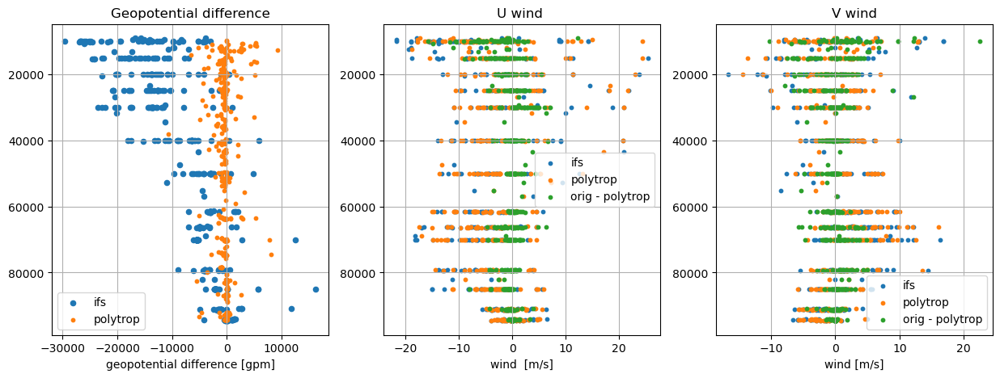

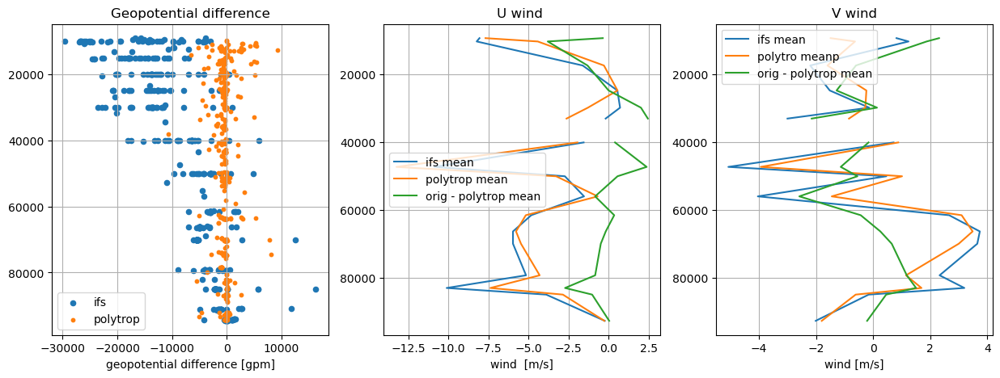

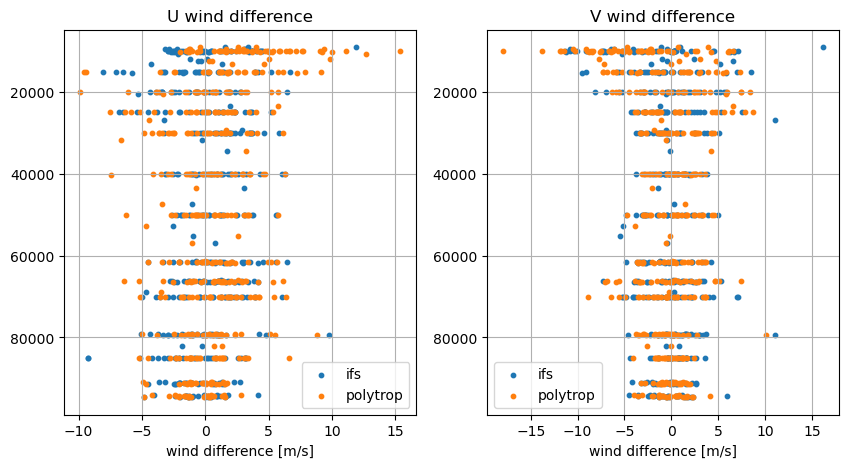

GP:  -7627.122943116272 8072.076470982821 13723.222994792959
GP poly:  -239.54555402750435 894.7600945586167 1262.9513026904892
V:  -0.40250444407361785 2.322203333162924 2.909309663161
V poly:  -0.5584687001754148 2.538810845052848 3.4785494568467286
U:  0.13544437899568762 2.0771816721539094 2.2759977731659515
U poly:  0.6940744833768229 2.3880105427623604 3.0498740634074823

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94174_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -10.579999923706055  lon:  142.22000122070312
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94287_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 

/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94476_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -27.549999237060547  lon:  135.42999267578125
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94380_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -23.850000381469727  lon:  151.27000427246094
Found ascents where both (pilot and rs) are available:  185


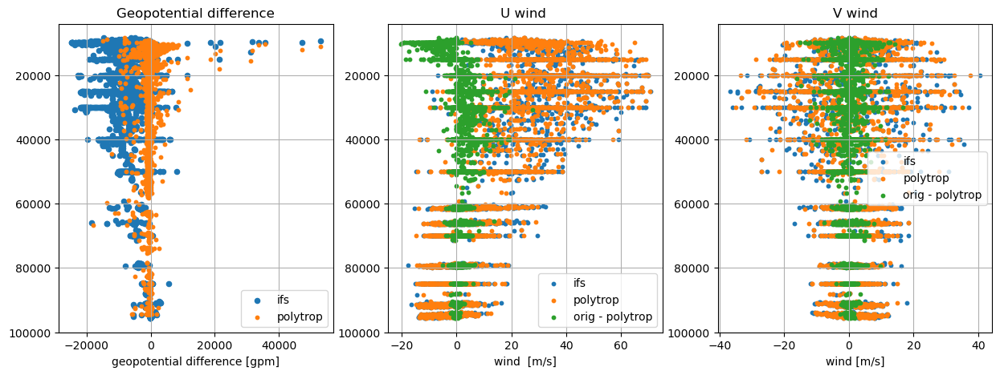

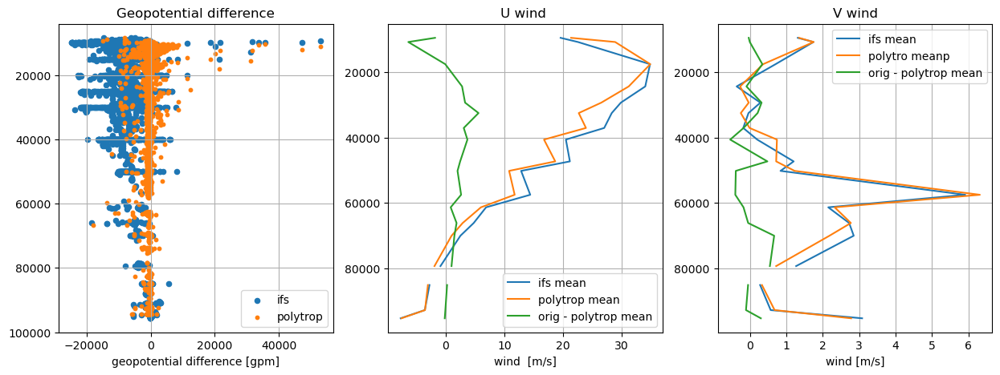

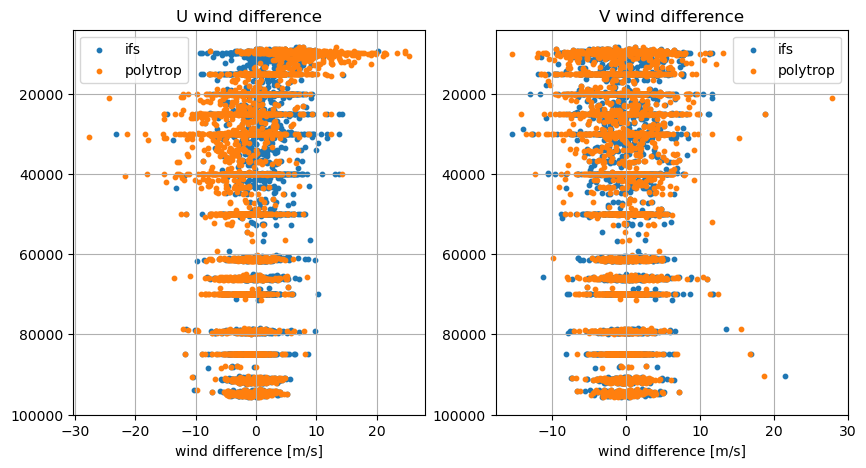

GP:  -5939.821070065062 6398.610676448217 8893.212664374365
GP poly:  -482.9080791538017 1061.715140105151 1402.631016531796
V:  -0.07705306125029644 2.440633384668216 2.8393950458897943
V poly:  -0.12200476430387412 2.5408638751705657 3.110212682927315
U:  0.5363961797924885 2.5415185302357126 2.9603181014268953
U poly:  -0.14577432363247 3.5946165952250966 4.720821698837304



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94212_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -18.219999313354492  lon:  127.6500015258789
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94294_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -19.25  lon:  146.75
Found ascents where both (pilot and rs) are available:  203


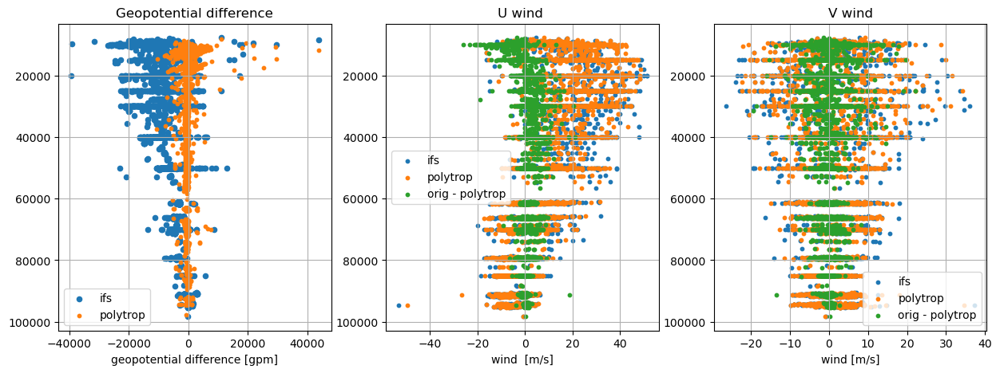

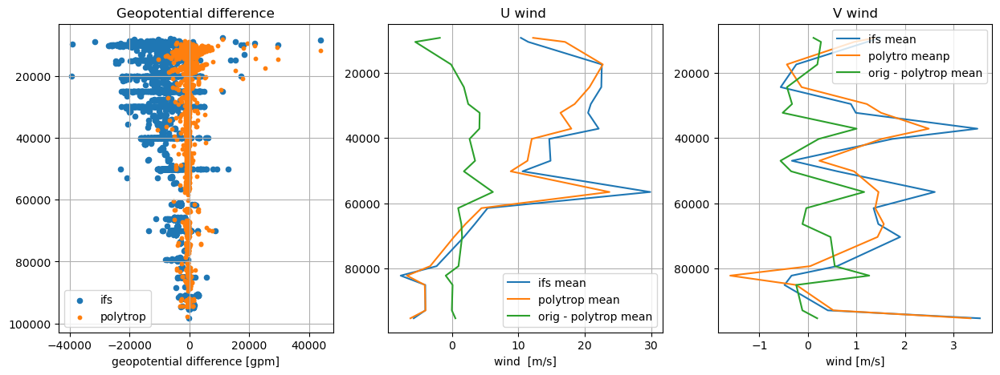

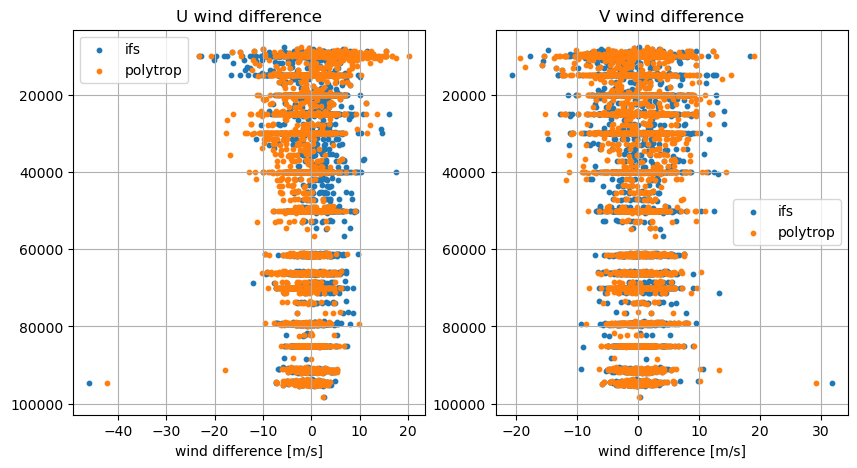

GP:  -6387.096650614798 6764.63660254212 10116.090900268433
GP poly:  -356.10619427440366 886.4214473836211 1240.8692786767733
V:  -0.04654362408695874 2.6037738253425236 3.186134440265707
V poly:  -0.06926960446541867 2.6308462462761333 3.32733822686213
U:  0.14580549895551417 2.6259964245747227 3.144083999332816
U poly:  -0.32256108905729747 2.961733324160736 3.7763371103866663



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94346_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -23.43722152709961  lon:  144.27694702148438
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94238_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -19.6299991607666  lon:  134.1699981689453
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94332_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index

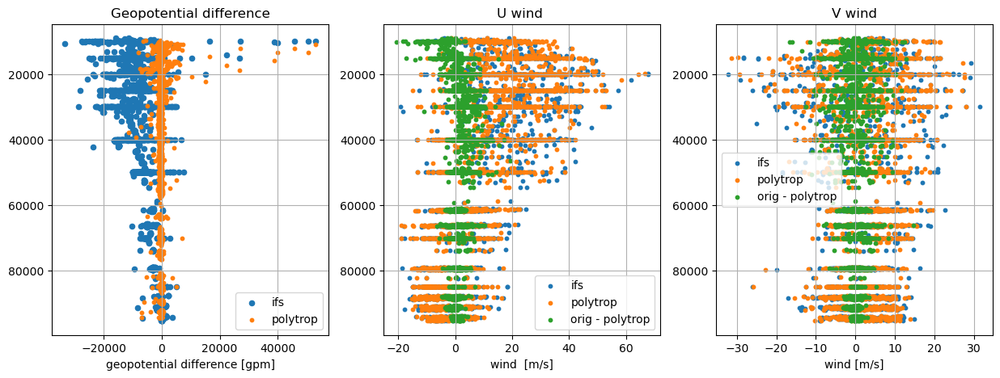

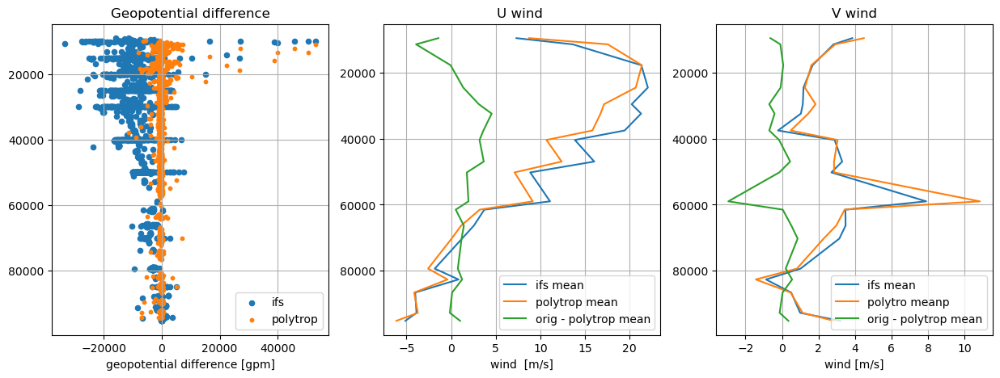

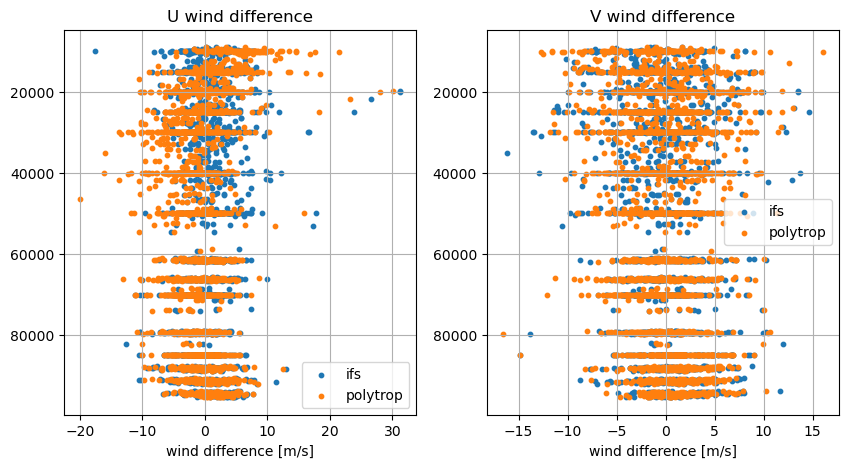

GP:  -5781.848029713311 6264.830219898469 10335.34557727542
GP poly:  -223.83627172500312 726.0167362217638 1117.7648041655957
V:  0.03624951427817949 2.537525188873938 2.816194956848179
V poly:  0.03527737475258874 2.707379358533079 3.1589726025164873
U:  0.3716341869095769 2.390171347511333 2.561138073586095
U poly:  -0.4401170472991367 2.852941992952894 3.4368578706920507



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94430_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -26.600000381469727  lon:  118.5199966430664
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94299_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -16.299999237060547  lon:  149.97999572753906
Found ascents where both (pilot and rs) are available:  212


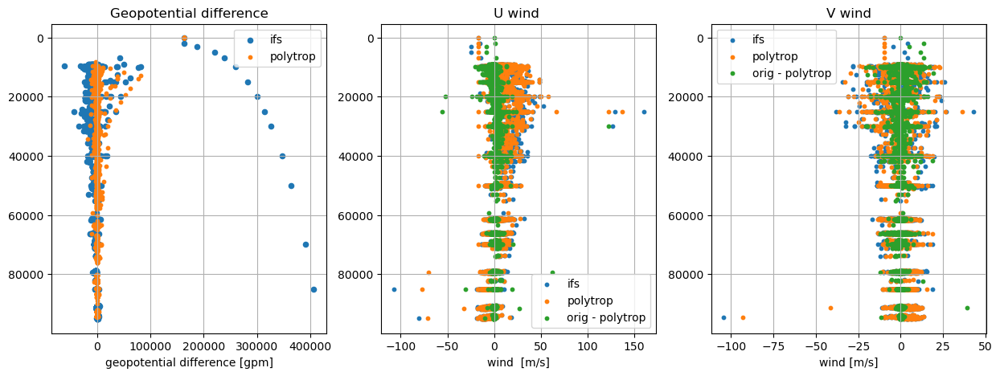

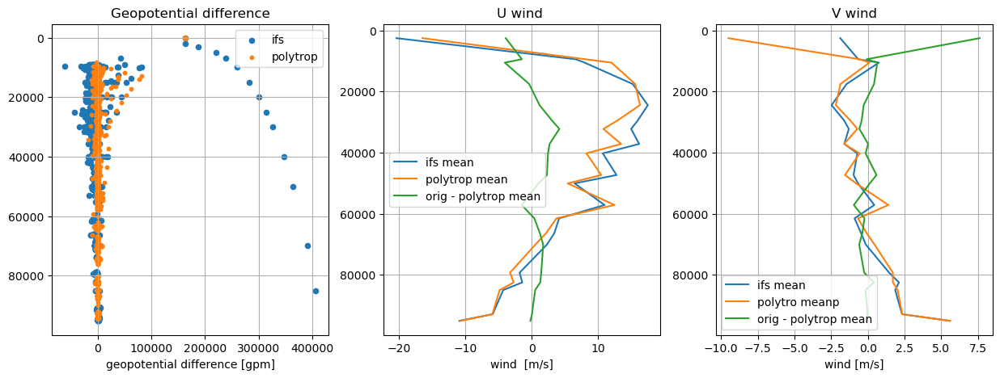

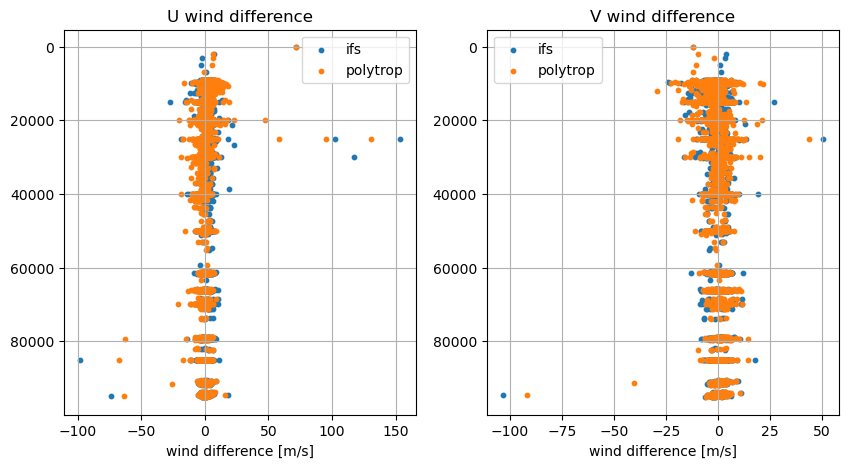

GP:  -5421.285730734953 8488.27631571637 12939.077650467487
GP poly:  558.2639667384085 1766.4979886776762 3034.8206624154336
V:  -0.3088063855472729 2.569961601866083 2.9956973798814777
V poly:  -0.26289615536924044 2.739577808951654 3.4598561899081903
U:  0.5588403343979256 2.514457975375246 2.8664560750082884
U poly:  0.043130581458911715 2.8771343176821844 3.6118479692700403

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94120_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -12.399999618530273  lon:  130.8699951171875
Found ascents where both (pilot and rs) are available:  259


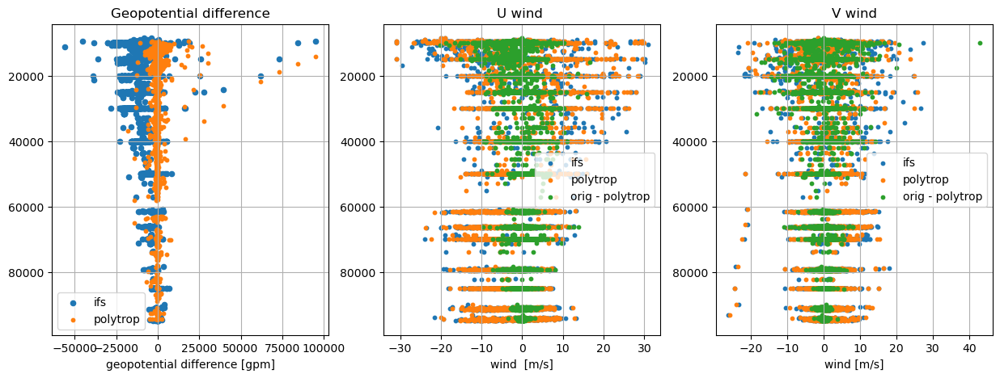

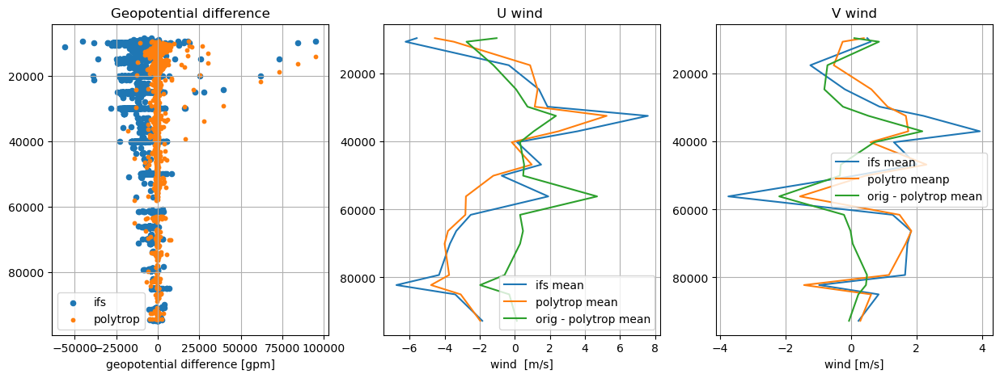

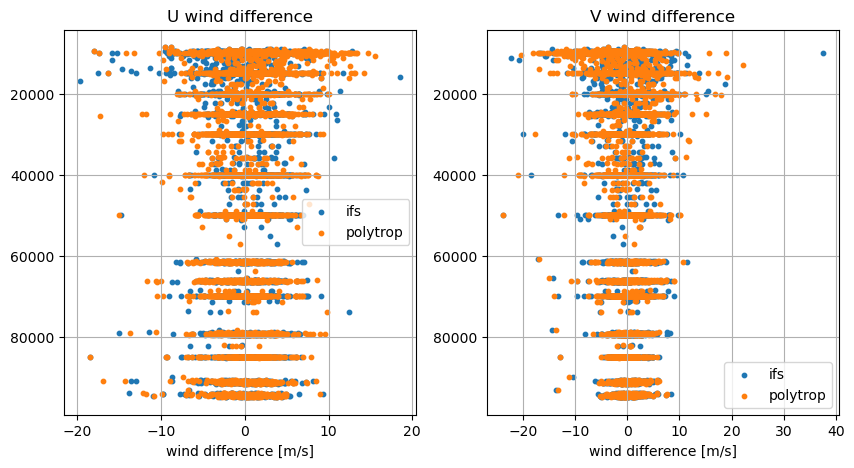

GP:  -7198.977438019622 7717.0004439986815 12178.672413110135
GP poly:  -61.126132284414425 847.232648078309 1327.096096660337
V:  -0.1762741505573262 2.4945306405531262 3.0521273918850116
V poly:  -0.17835201692066285 2.6276530454772513 3.4271776136763576
U:  0.11616074519520214 2.2988122420874415 2.572788067868339
U poly:  0.4628180697903347 2.550340337584576 3.048693217520773



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94403_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -28.804445266723633  lon:  114.69889068603516
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94326_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -23.795000076293945  lon:  133.88888549804688
Found ascents where both (pilot and rs) are available:  234


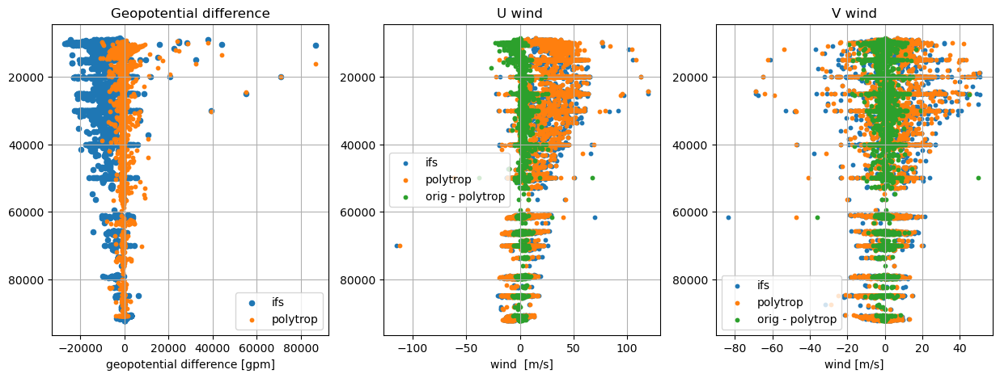

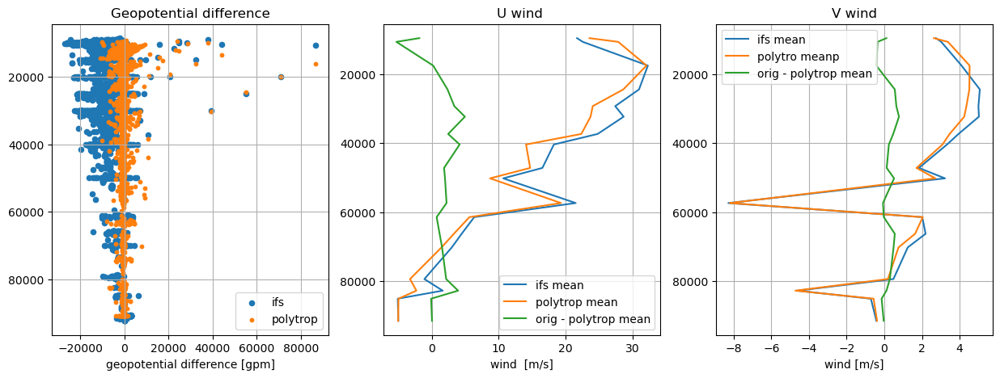

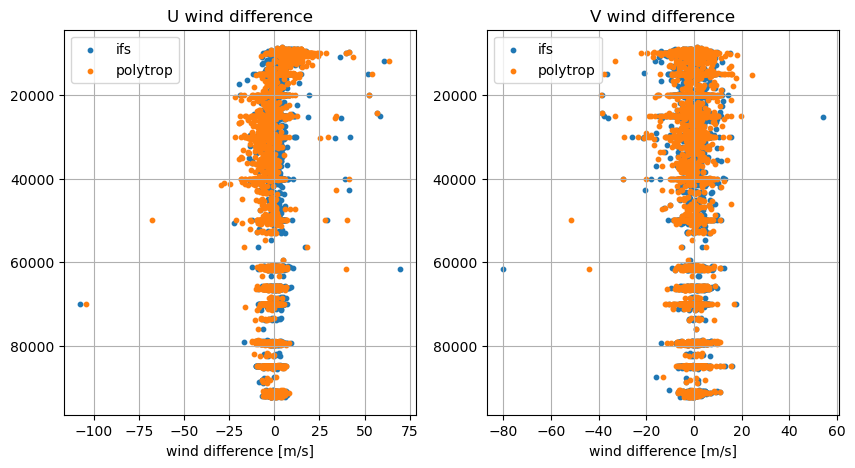

GP:  -6294.026730172176 6832.107623700532 9256.230507257087
GP poly:  -452.34364555948787 1182.3376839041644 1538.9547171772963
V:  -0.3234026364451072 2.841252353082835 3.2797627992653386
V poly:  -0.4845099900445924 3.200138615335846 3.8143543859901405
U:  0.5882643441112614 3.0383503004026284 3.523415293525165
U poly:  -0.2491463527324572 4.4270544919597254 5.621944478526262

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94659_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -31.149999618530273  lon:  136.8000030517578
Found ascents where both (pilot and rs) are available:  159


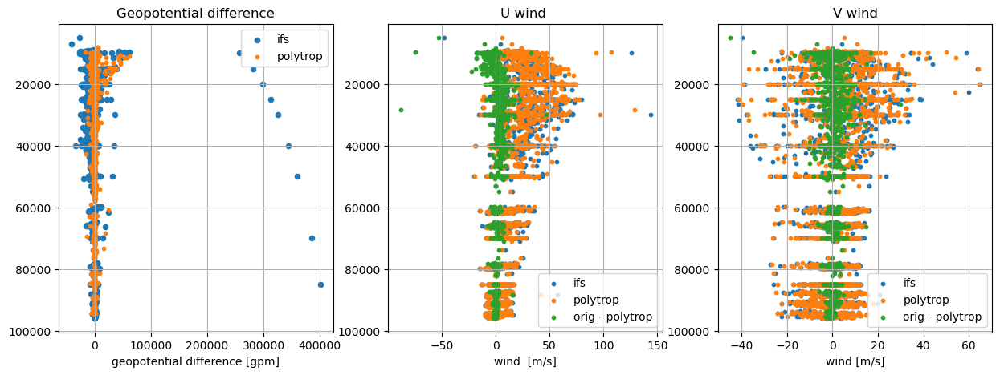

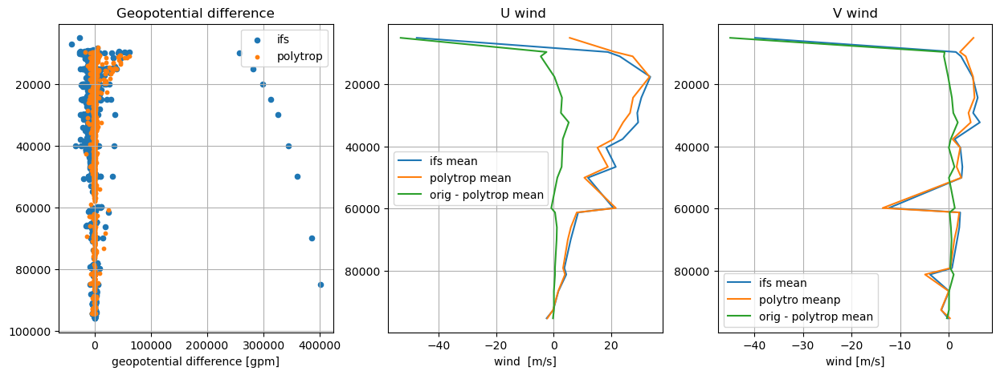

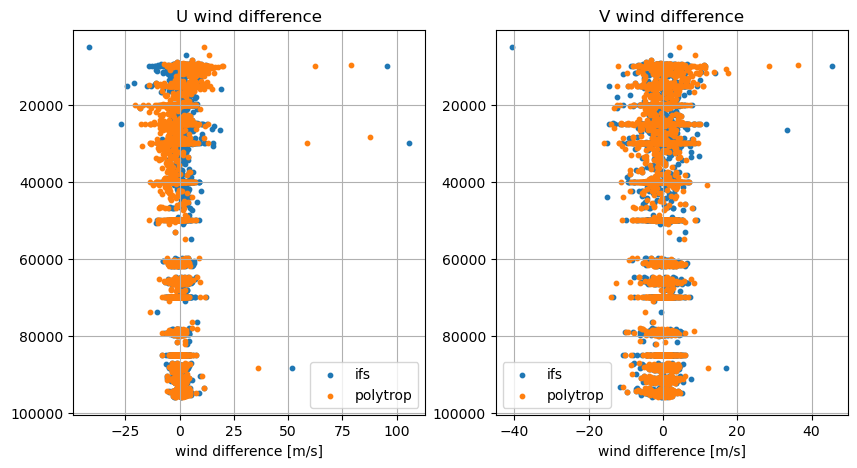

GP:  -3767.9128785047387 7259.512013529691 10619.244833408464
GP poly:  -282.848584074622 1463.5345047166888 2124.735158533193
V:  -0.1710193474998017 2.367971679790178 2.802424849563508
V poly:  -0.2941380787495867 2.468817289172021 3.0433144240474053
U:  0.5237393477564148 2.5071561666959434 3.182079007052863
U poly:  0.002191738619903028 3.137897060920172 4.4599443937396535

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94711_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -31.483888626098633  lon:  145.82943725585938
Found ascents where both (pilot and rs) are available:  196


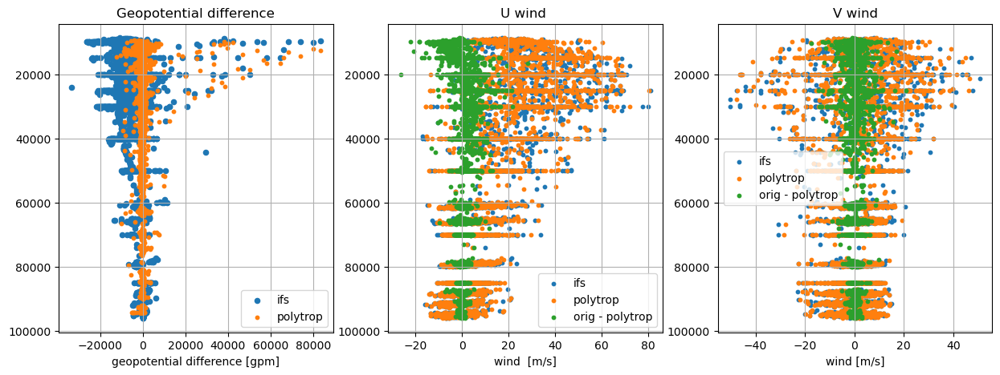

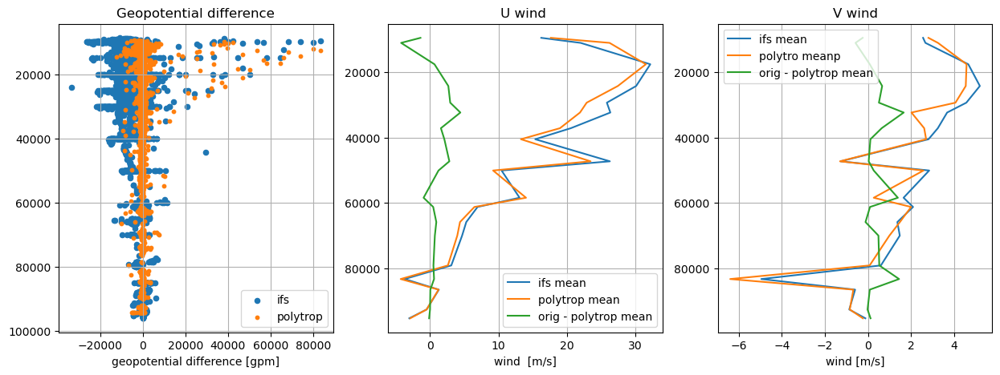

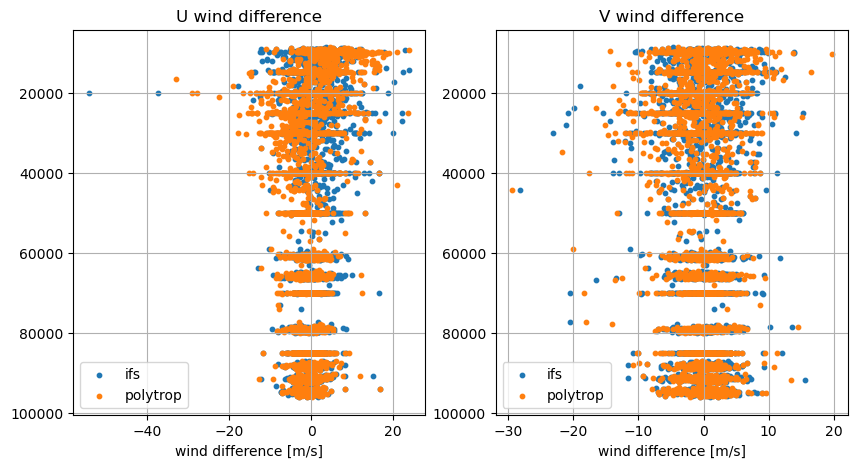

GP:  -4351.625782954821 5968.468221685239 9015.291194003717
GP poly:  -28.809007193549267 1336.1960711580004 2023.7444150562062
V:  -0.023787288807693926 2.5996524118180315 3.008423113750051
V poly:  -0.190078418385719 2.6252992081181614 3.1704767414008432
U:  0.43073799102998045 2.843227349007641 3.5639165733819422
U poly:  -0.11685454697396949 3.2552187828326065 4.436368111274254

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94653_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -32.119998931884766  lon:  133.6999969482422
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94302_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 1

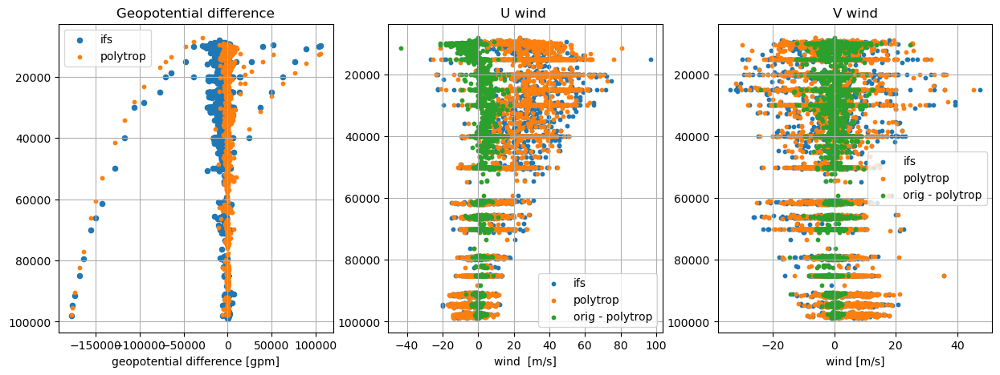

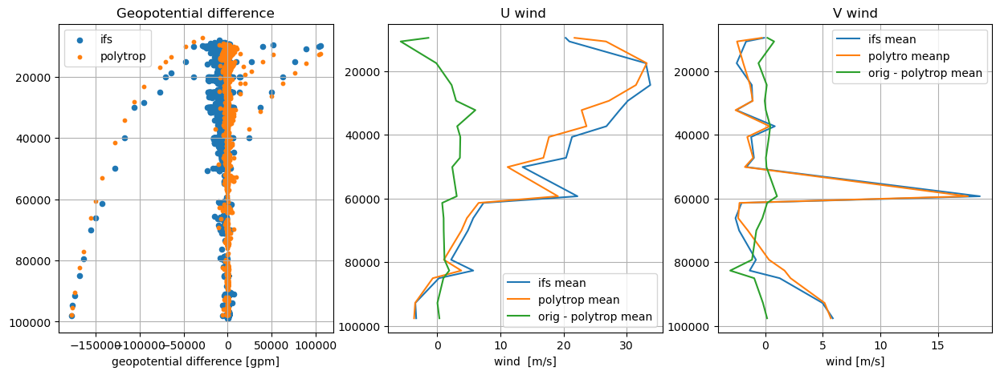

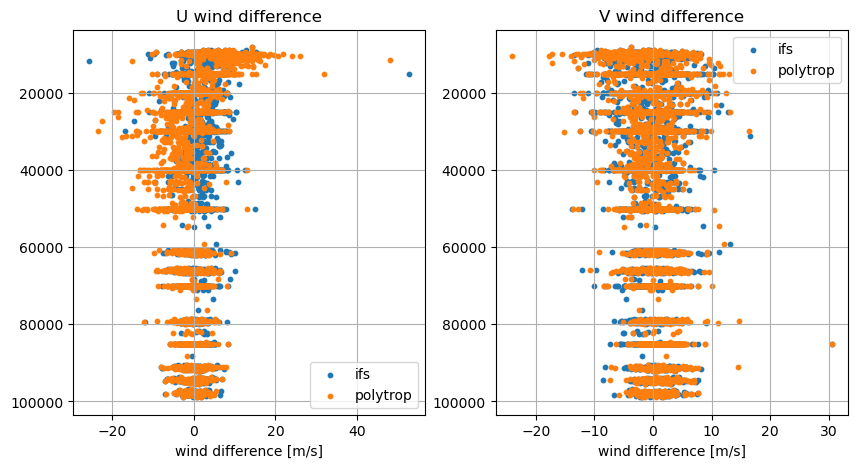

GP:  -5962.318045886236 6729.664311920124 9187.865864384143
GP poly:  -624.7681717045692 1668.7684944430878 2066.0883961618442
V:  -0.2047700350147499 2.5235053462558676 3.032585930737969
V poly:  -0.10230485203181876 2.7150115466145883 3.297462575474091
U:  0.9702439777065985 2.457014446277551 2.9077592041821516
U poly:  0.3696159400181116 3.2751181737919053 4.4377664036736295

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94693_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -34.22999954223633  lon:  142.0800018310547
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94767_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 1

/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94750_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -34.94694519042969  lon:  150.5352783203125
Found ascents where both (pilot and rs) are available:  168


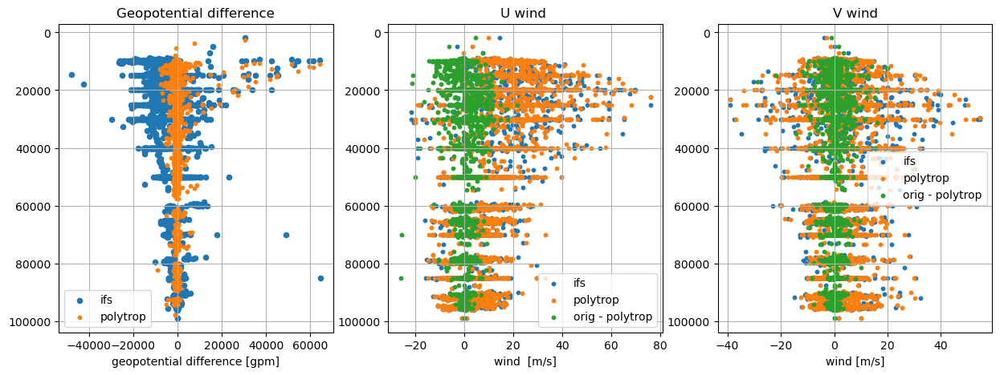

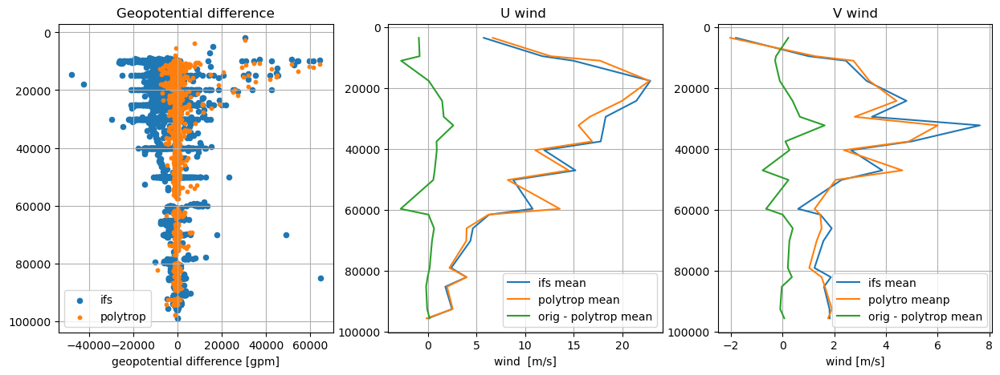

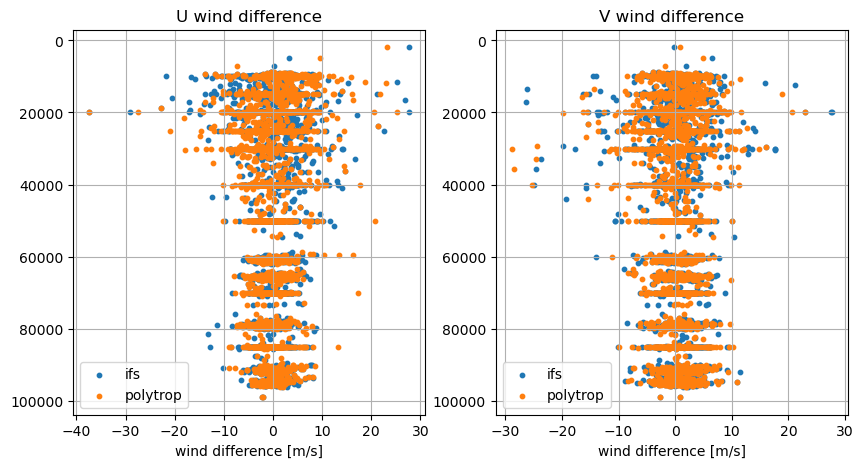

GP:  -3459.4012286083125 6161.570198619094 8970.483366802655
GP poly:  -147.1334792891057 1307.4677778791624 1830.1327202549992
V:  0.3782372530499866 2.589170147194016 3.0509197698806667
V poly:  0.2423374927519063 2.539959287046951 3.0235684666246887
U:  0.188130275452908 2.858731597296999 3.6388782760659946
U poly:  -0.022076240755874416 2.9145050711423406 3.751135719624782

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94203_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -17.950000762939453  lon:  122.22000122070312
Found ascents where both (pilot and rs) are available:  142


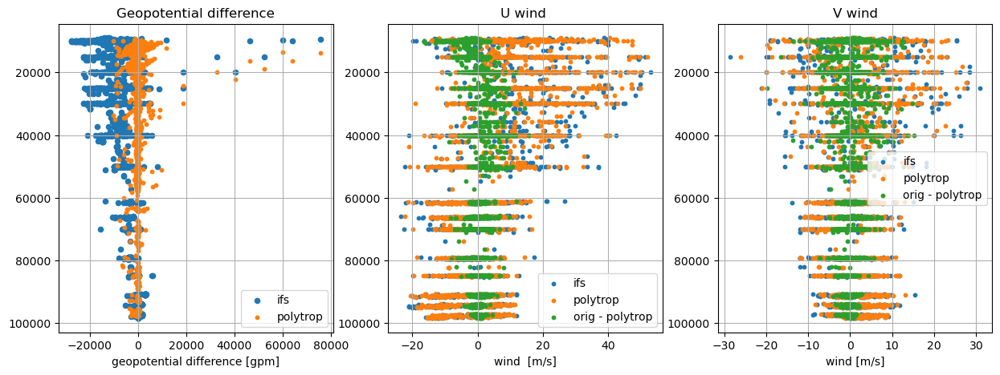

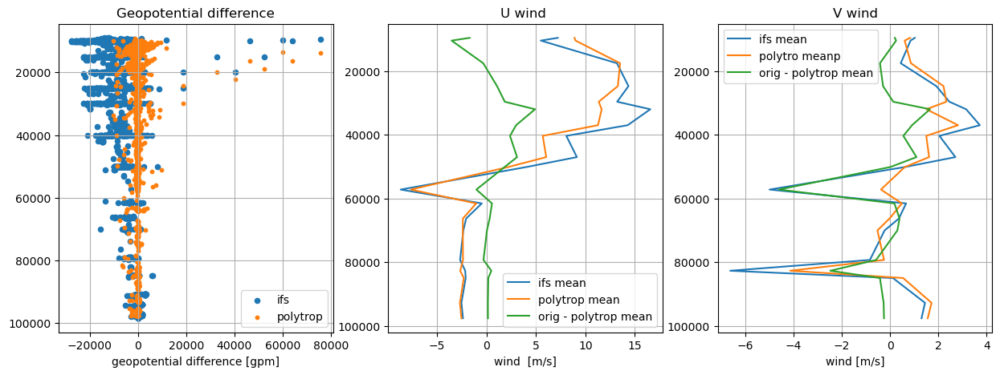

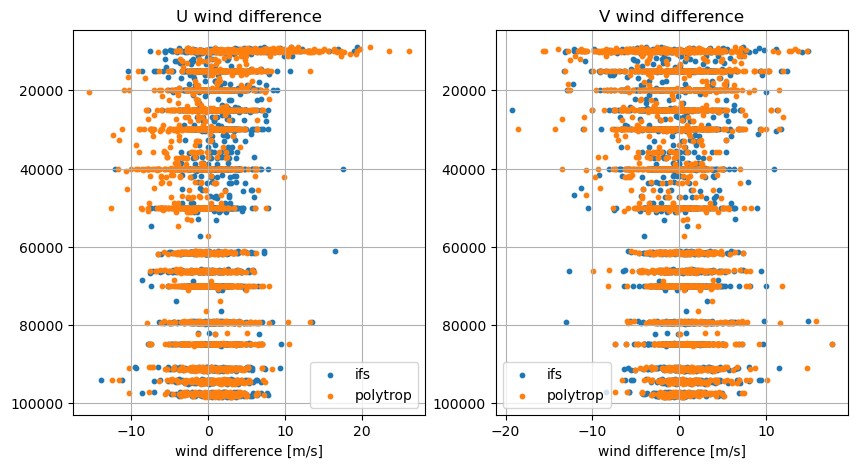

GP:  -6101.711264642185 6804.575013412396 10705.704041347755
GP poly:  -33.78721855442744 872.4789453666644 1476.4869089552092
V:  -0.06428852918861631 2.46579456523722 2.9153815576939826
V poly:  -0.04751328343616359 2.6954082597797795 3.3922584979826294
U:  0.7580923040825246 2.351690001517914 2.600674327289642
U poly:  0.4931689610846057 2.9008275584692207 3.562229734153617

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94312_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -20.3700008392334  lon:  118.62000274658203
Found ascents where both (pilot and rs) are available:  268


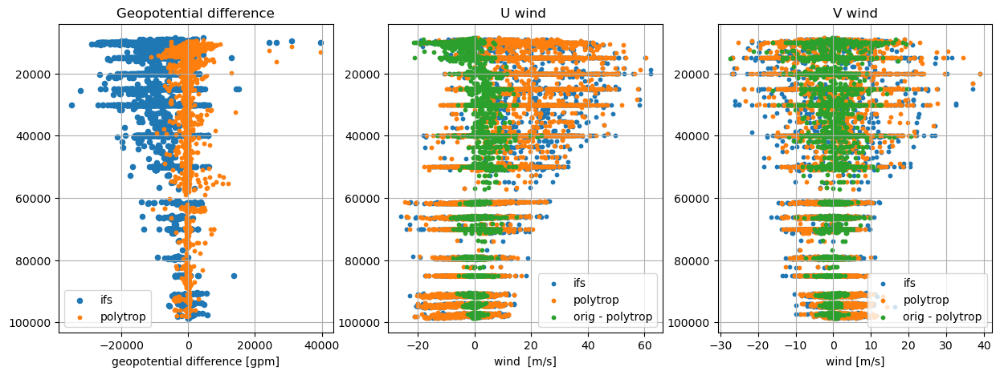

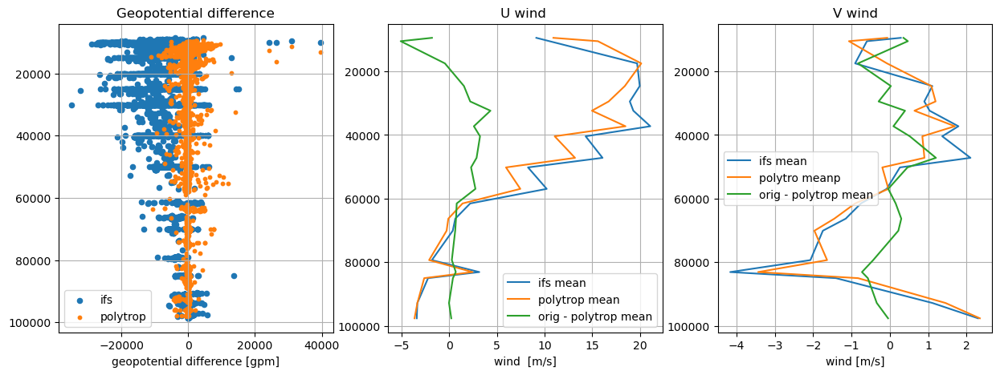

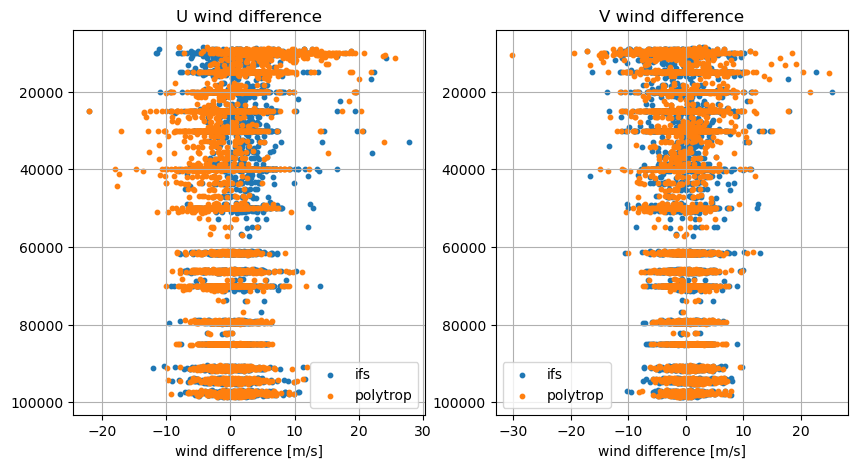

GP:  -6028.7275393288755 6466.003222719378 9980.909528432818
GP poly:  -110.15390755404175 766.1074800838967 1117.8487300129796
V:  -0.2416262091802413 2.464566156960503 3.0337361668288874
V poly:  -0.2020864642293317 2.656120270788651 3.430419867153653
U:  0.747966159296933 2.3507933360594575 2.6427477708425413
U poly:  0.42553851527476855 2.928231825619917 3.7430313323185502

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94995_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -31.520000457763672  lon:  159.0800018310547
Found ascents where both (pilot and rs) are available:  124


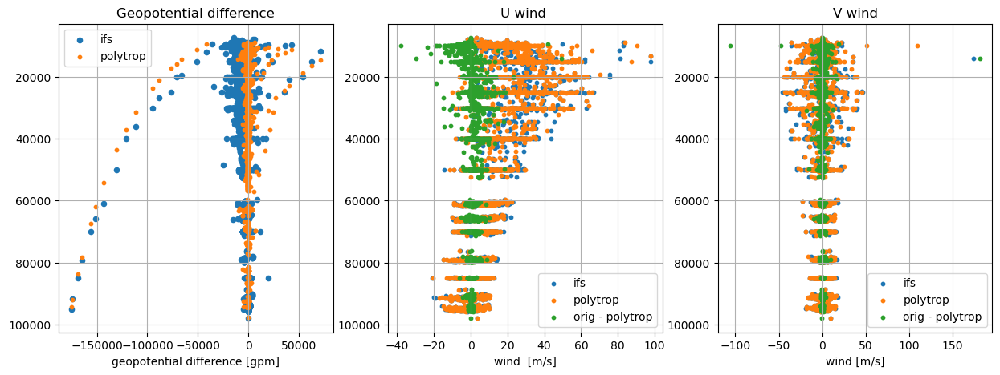

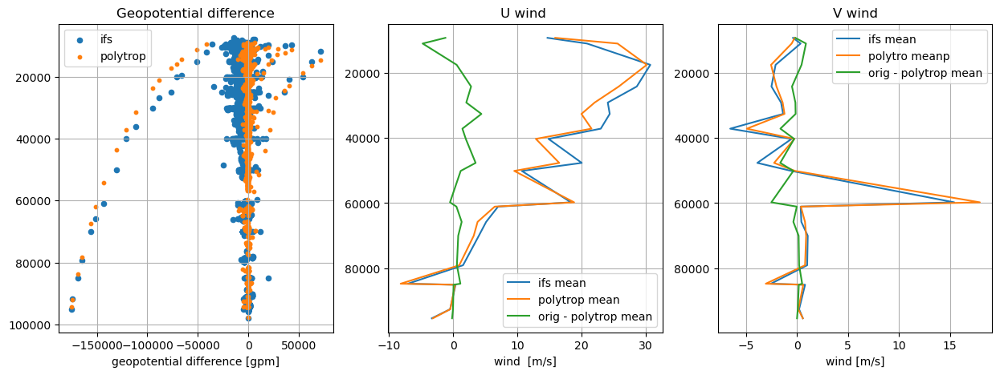

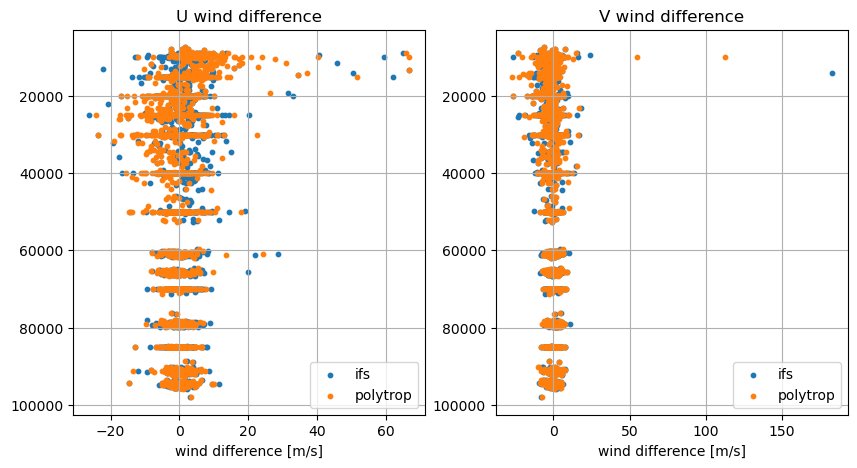

GP:  -5933.320545523426 7266.004939653879 9683.103811907922
GP poly:  -1179.3760730198287 2279.873146467699 2570.8944042763037
V:  -0.9366077742111988 3.0330902876479833 3.7708551331791678
V poly:  -0.9481563215396488 2.9725464298329007 3.7740989503554196
U:  0.7642611743206813 3.223498244075595 3.9444995872957804
U poly:  0.2672570994197945 3.7059706092690705 5.042559902538828

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94776_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -32.779998779296875  lon:  151.82000732421875
Found ascents where both (pilot and rs) are available:  205


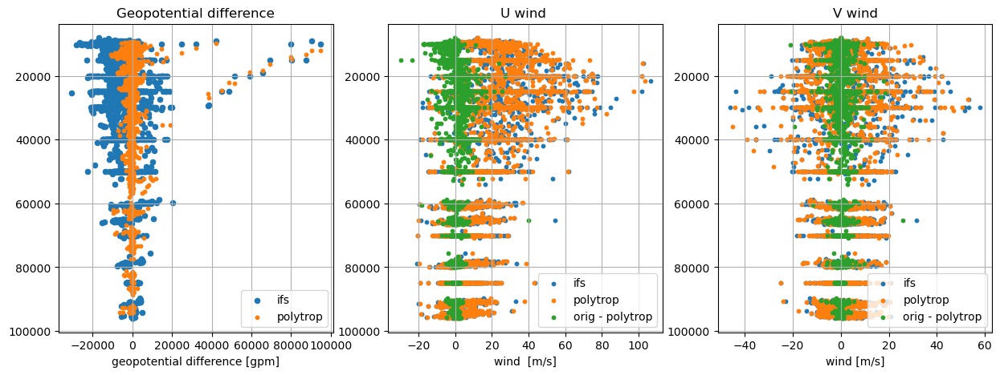

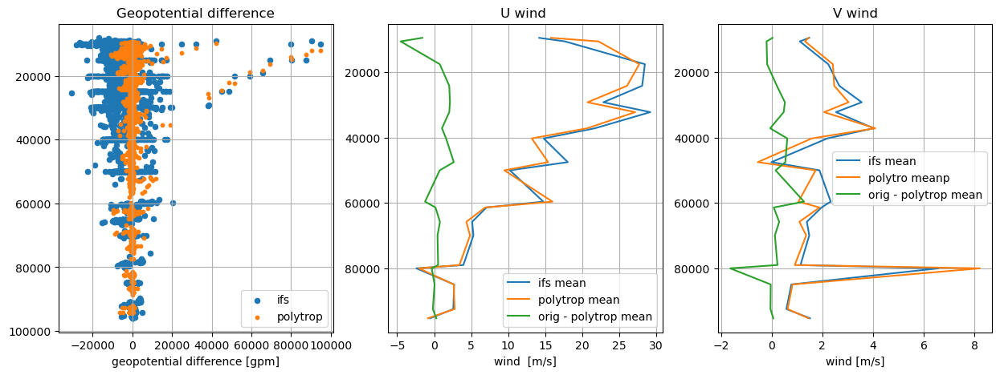

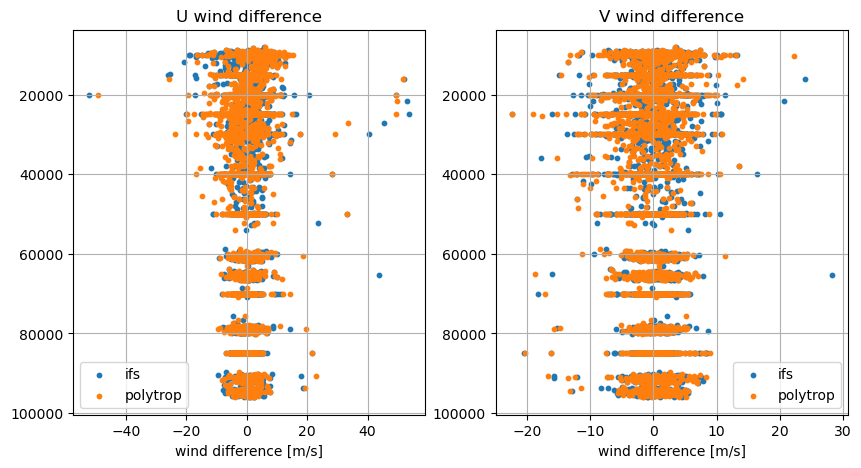

GP:  -4322.475801337604 6316.929178584725 8986.48651801808
GP poly:  -230.57420895984816 1295.1257431960423 1762.114823673182
V:  -0.07530509835230156 2.395096520999323 2.770924496964265
V poly:  -0.1928836997774298 2.427625723087668 2.8540322250639405
U:  0.4401489530598422 2.7844372155019985 3.3811347391558373
U poly:  0.1585999838527949 3.1493309867252157 4.089603759090777



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94791_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -30.31999969482422  lon:  153.1199951171875
No matching ascents found.

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94578_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -27.43000030517578  lon:  153.0800018310547
Found ascents where both (pilot and rs) are available:  253


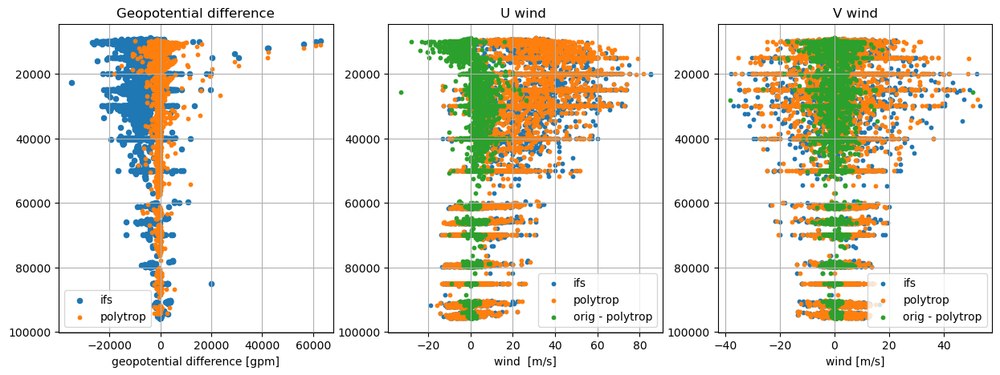

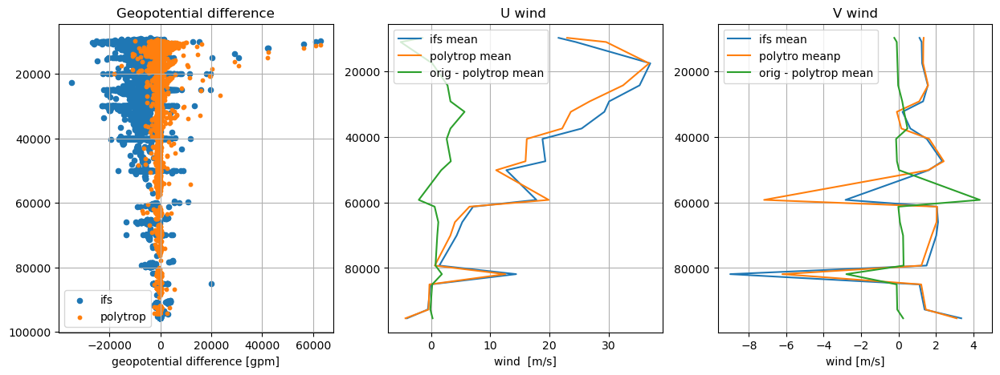

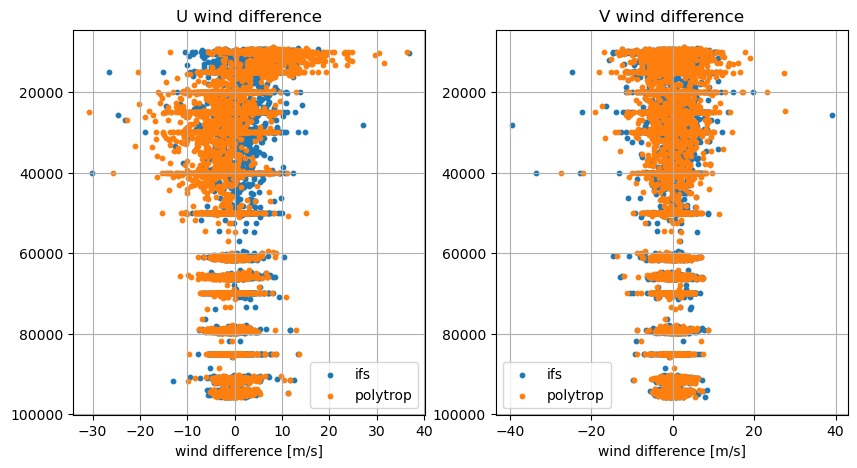

GP:  -5356.726464206003 5947.7100194386685 7953.512232403117
GP poly:  -392.6758136622565 1062.4453217182304 1396.6796803725276
V:  -0.05069223218577104 2.4544847366922715 2.922198120891503
V poly:  -0.08084176004453683 2.5996227808915693 3.2216313873834888
U:  0.696609568710006 2.796014428309257 3.4277463213963943
U poly:  0.11318406373982137 3.81949188327551 5.176715682399881

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94637_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -30.770000457763672  lon:  121.44999694824219
Found ascents where both (pilot and rs) are available:  136


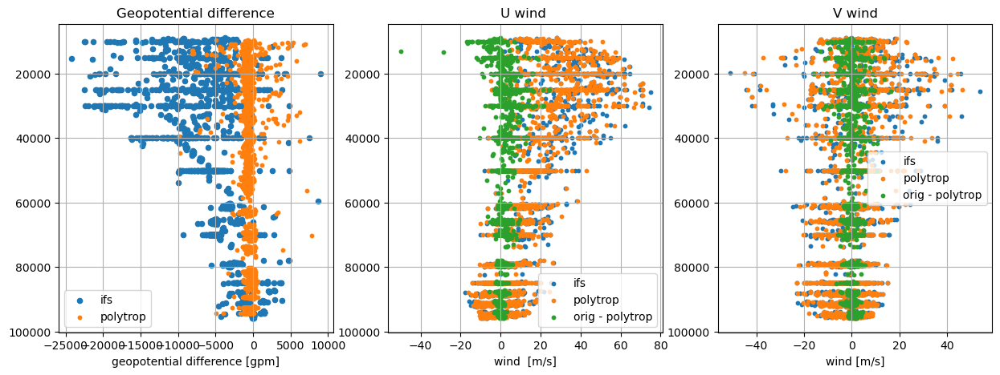

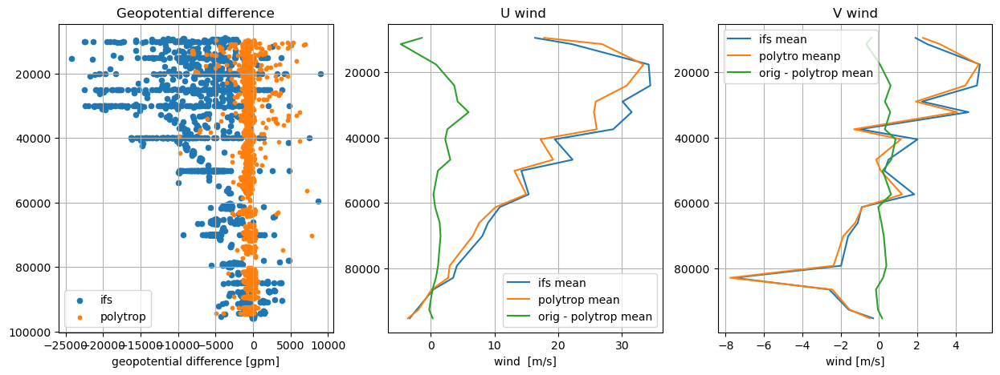

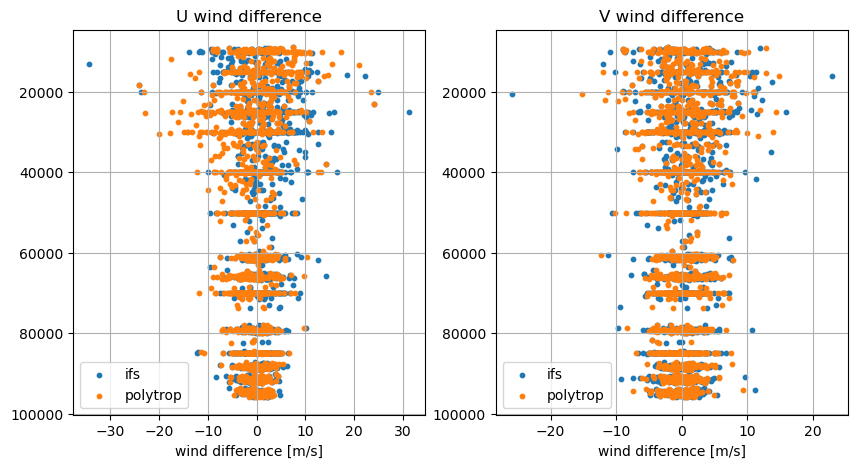

GP:  -4822.973708435675 5073.088100469232 8531.229332724806
GP poly:  -575.9510395300692 856.5861103721287 1185.941130132885
V:  0.43966730210178406 2.4024335889928583 3.1107242841011202
V poly:  0.28995920432845823 2.3533035470554173 3.0722152455087897
U:  0.590464322704203 2.7419297198869845 3.886524657716214
U poly:  -0.4845090504609899 2.8424606483440624 4.2186606508846936

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94510_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -26.420000076293945  lon:  146.27000427246094
Found ascents where both (pilot and rs) are available:  224


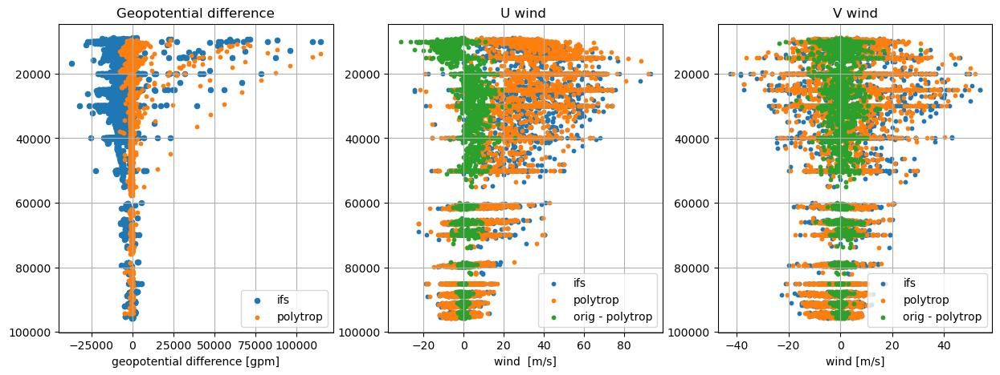

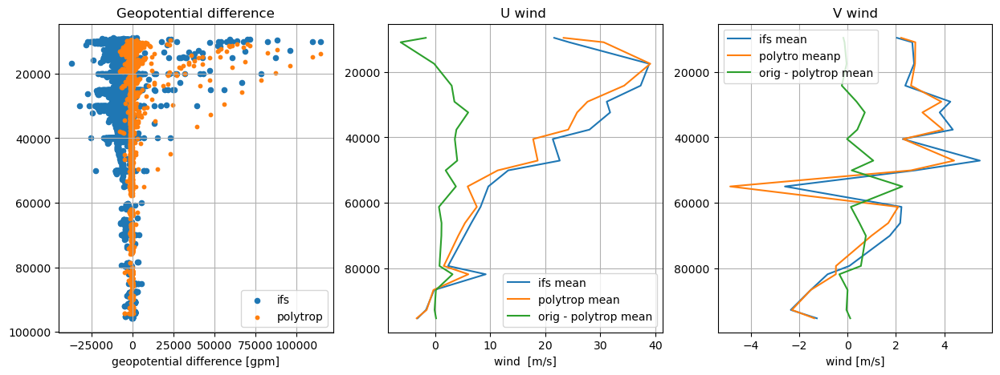

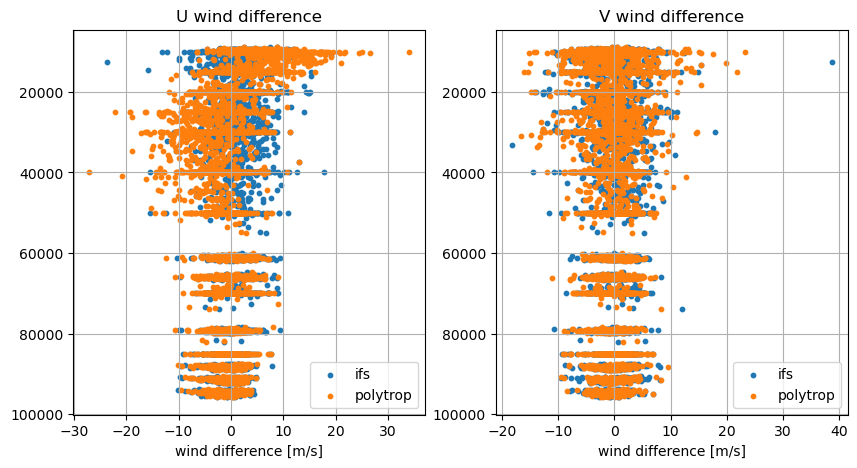

GP:  -4646.552563077448 6253.324296528864 9259.955011644035
GP poly:  207.2152734516535 1465.4247441096059 2314.801225861477
V:  -0.14900381846301364 2.3798009984552015 2.800301875743439
V poly:  -0.2828933889281809 2.568056235761986 3.1887173745508495
U:  0.5228881122197859 2.5839725216298564 3.0657044165776703
U poly:  -0.041551436230647644 3.6053447155531484 4.95648416199453

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94461_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -25.030000686645508  lon:  128.3000030517578
Found ascents where both (pilot and rs) are available:  195


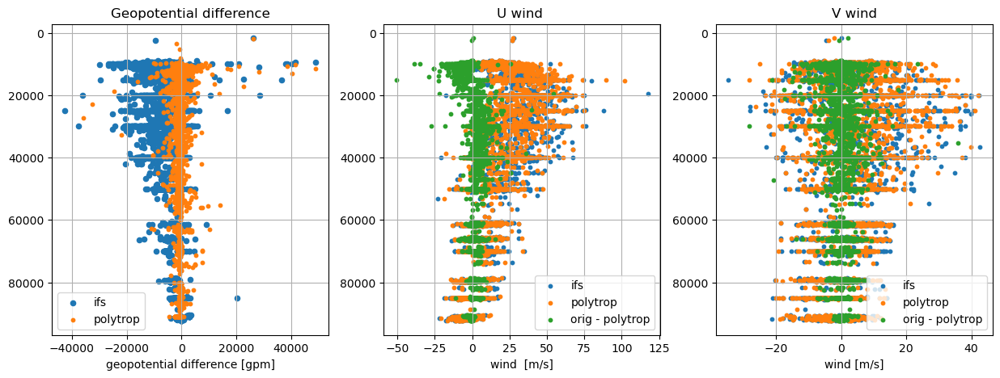

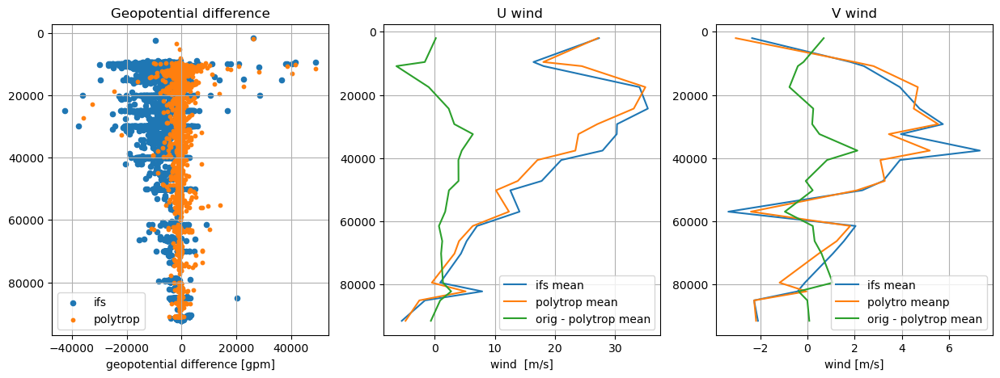

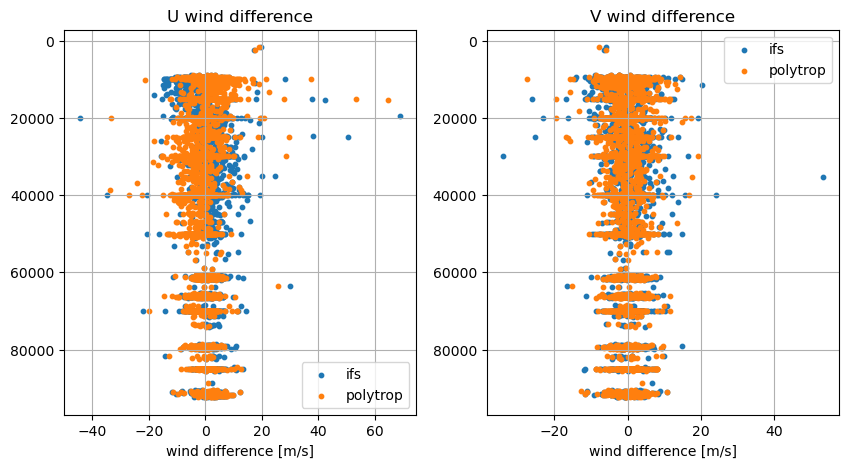

GP:  -6124.844229631808 6667.817085661894 8852.0103605219
GP poly:  -567.5350504009403 1291.4638482414277 1643.2832083326011
V:  -0.05508254348604058 2.882254965213969 3.2404741744262373
V poly:  -0.21196098509076144 2.6868874951963786 3.006332104861566
U:  0.24104990311048333 3.287926895430605 3.8926333774478317
U poly:  -0.3616849237737483 3.267904112878755 3.8226256962892937

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94672_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -34.93000030517578  lon:  138.52000427246094
Found ascents where both (pilot and rs) are available:  440


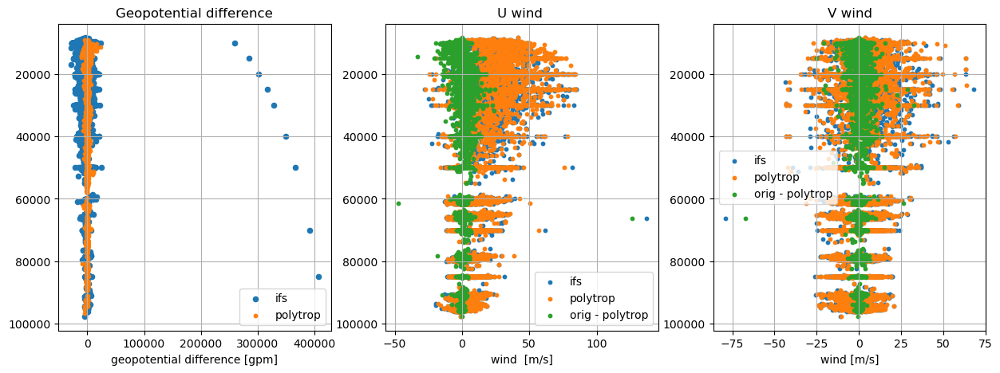

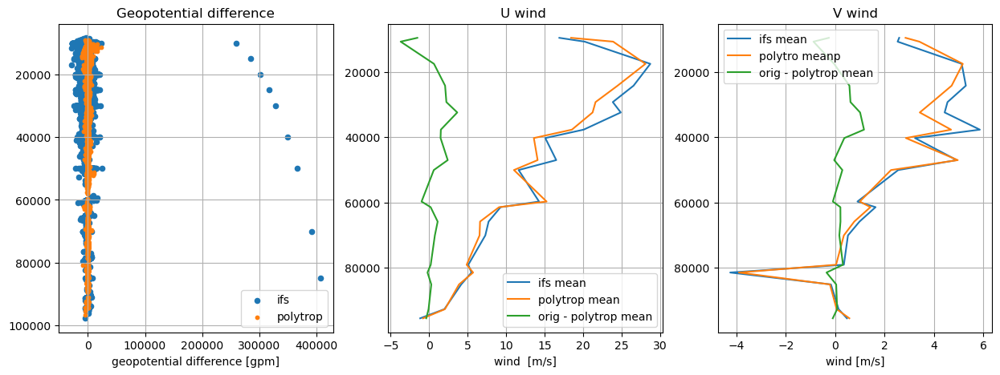

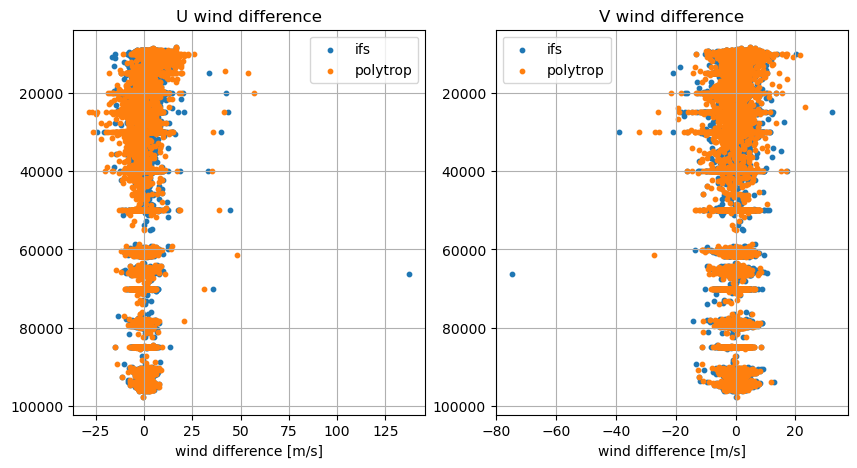

GP:  -4421.398670358696 6642.528487003575 9340.609814765592
GP poly:  -498.9243240001027 847.6008419547939 1021.1424943639025
V:  0.07435416119565412 2.46935516233778 2.842284893987825
V poly:  -0.050723471615195886 2.5992607166158486 3.1294643277865983
U:  0.5101012493363306 2.7200360975146447 3.241589542165468
U poly:  0.14906164592702587 3.370846748884587 4.485684592815308

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94638_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -33.81999969482422  lon:  121.87999725341797
Found ascents where both (pilot and rs) are available:  175


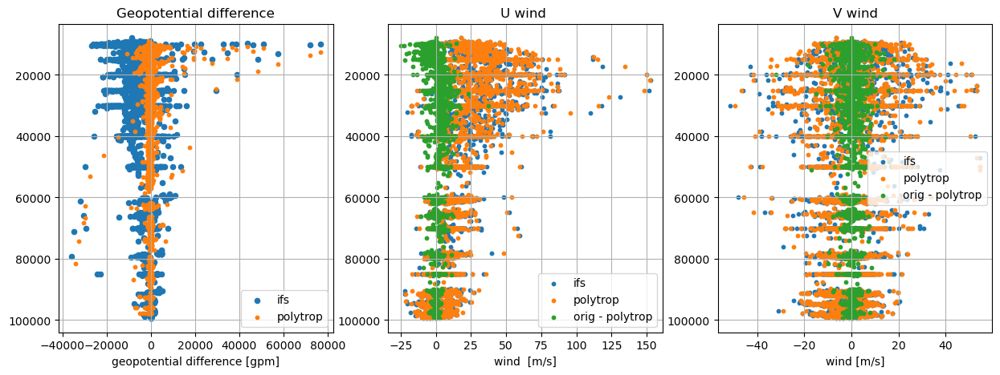

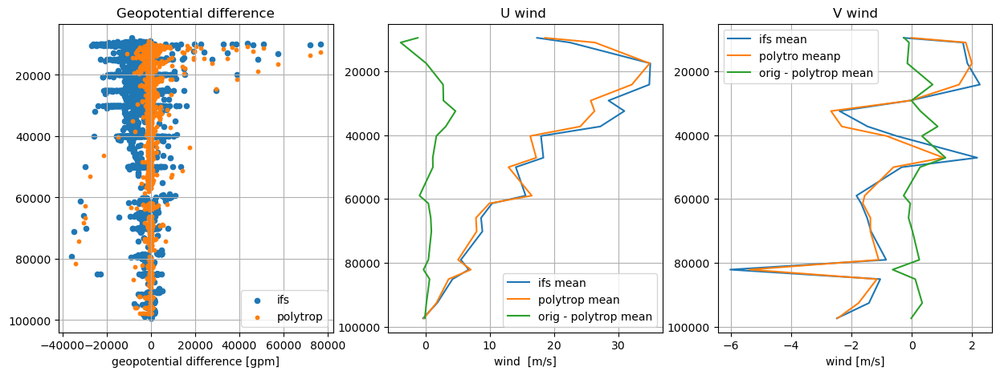

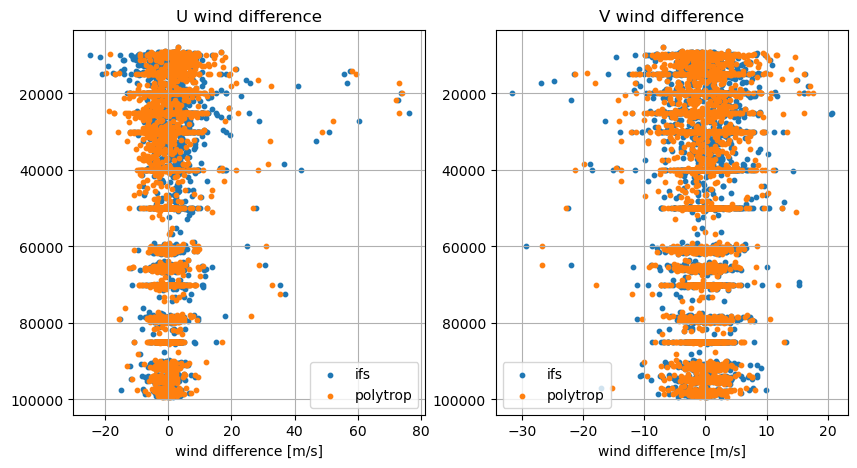

GP:  -4382.350846874911 5792.621695442599 8343.687601796242
GP poly:  -234.48941188877623 1190.375696992203 1580.7792276093496
V:  -0.04688452623210111 2.6403679431287275 3.0594508260479336
V poly:  -0.1662844054279925 2.5232863474063367 2.988608672149088
U:  0.526822927170185 3.1373722860012596 4.032199328058753
U poly:  0.03482317504514292 3.28654827425663 4.379760892432441



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94802_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -34.95000076293945  lon:  117.80000305175781
Found ascents where both (pilot and rs) are available:  168


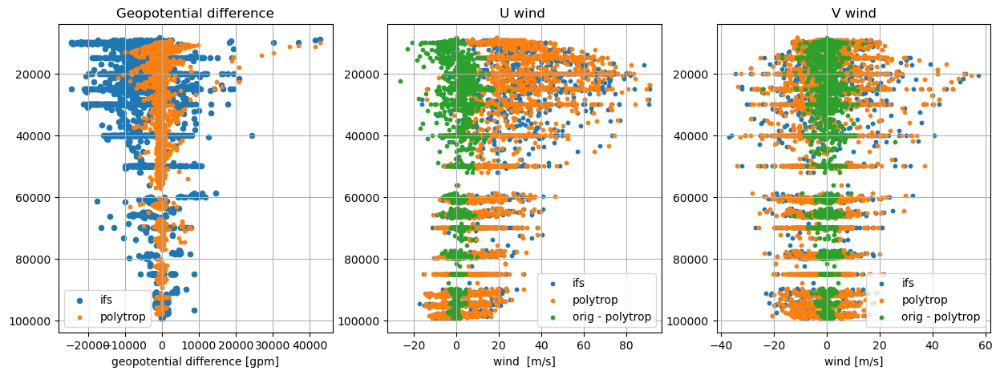

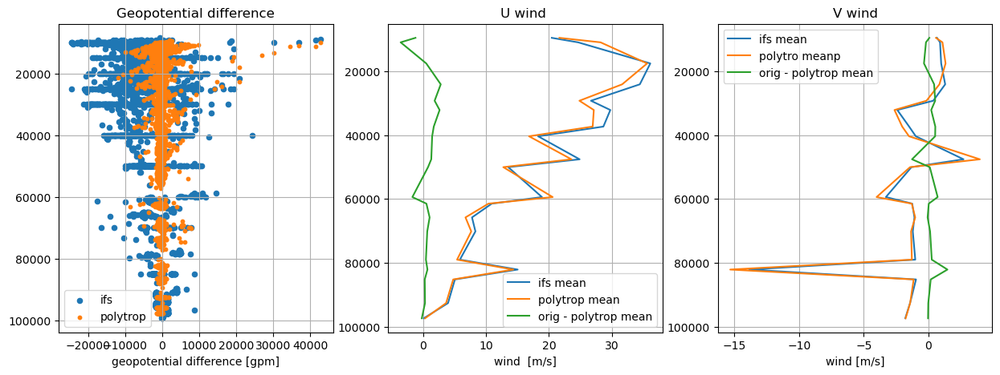

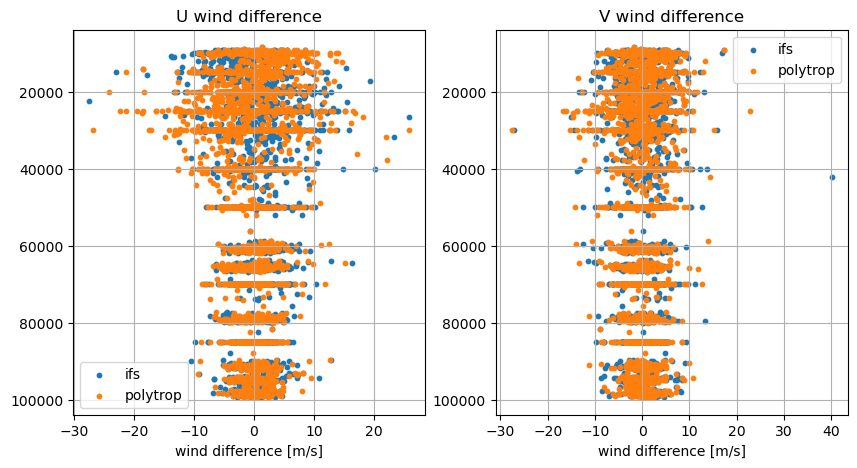

GP:  -3972.038428065122 5587.195354880693 7944.216576940624
GP poly:  -389.59408330420155 1121.6691153838067 1485.57847252342
V:  0.25952880024400055 2.647395580043358 3.037805519313764
V poly:  0.16249523023657075 2.5972574884369375 3.0123711307873235
U:  0.1487577777528701 2.8435461798436914 3.564228335537281
U poly:  -0.29331911090102253 3.096853848172224 4.115445571245127

/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94610_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -31.93000030517578  lon:  115.94999694824219
Found ascents where both (pilot and rs) are available:  450


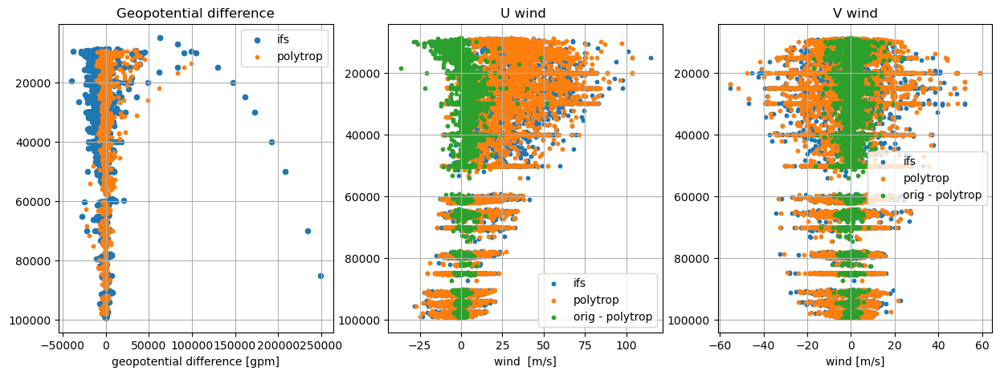

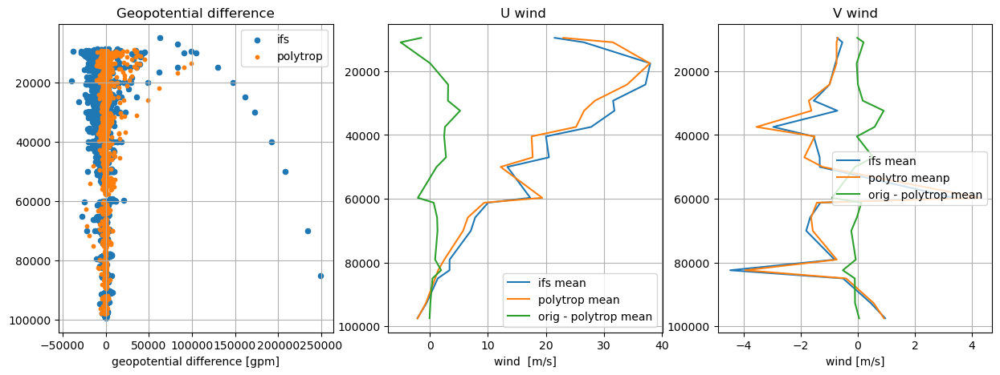

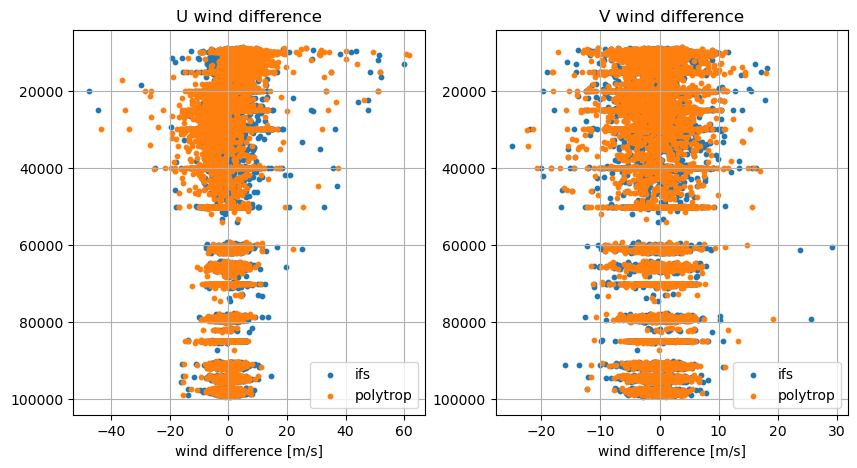

GP:  -4673.774590403803 6031.127283746727 8577.806377834215
GP poly:  -210.03784193822923 1059.0831789696713 1505.4501274681943
V:  -0.3426907355246708 2.460343050762882 2.860936697626387
V poly:  -0.3674668713920315 2.5973361073502206 3.148900137767592
U:  0.7360593211707182 2.8301747016308934 3.4507594390823604
U poly:  0.14531103527152006 3.5996005584619675 4.923507451896342



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20000-0-94996_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 39, 106, 107, 117, 126, 137, 138, 139,
       140],
      dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -29.030000686645508  lon:  167.92999267578125
Found ascents where both (pilot and rs) are available:  202


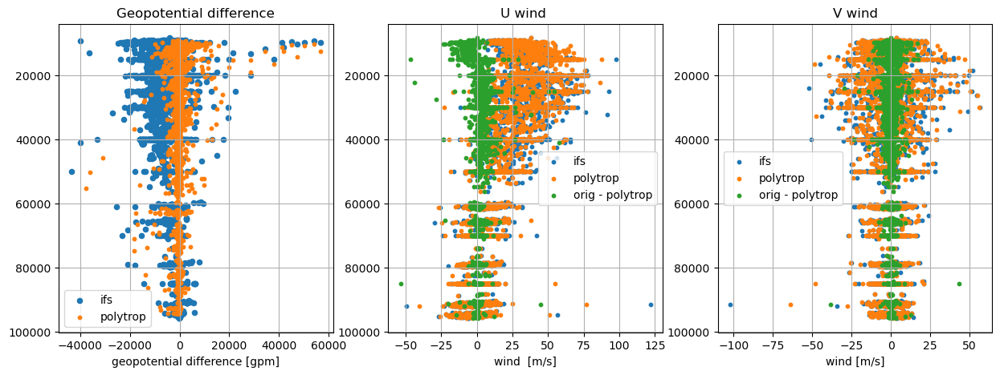

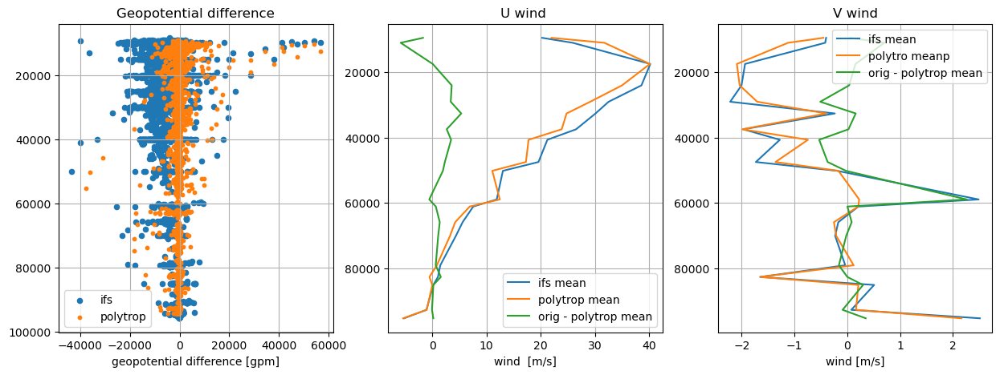

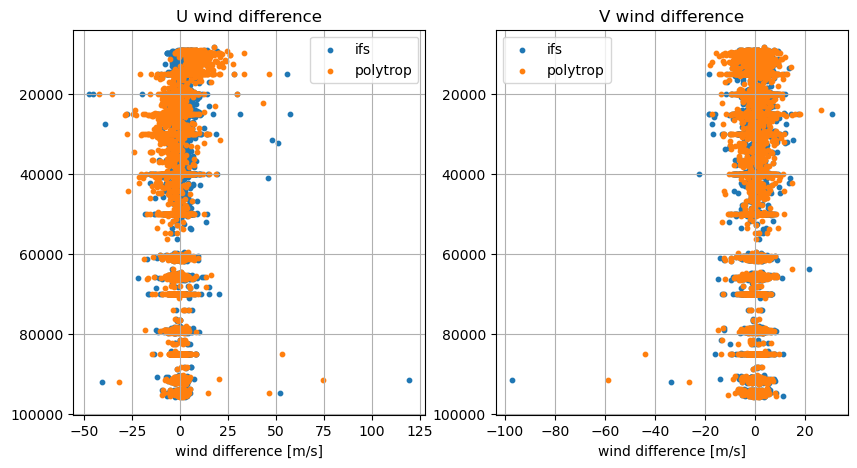

GP:  -5191.687699011926 6105.323485778275 8131.018684584965
GP poly:  -417.9494737937533 1330.2740929988563 1681.7694712250425
V:  0.19803023883465426 2.6420076629532154 2.9058131269694587
V poly:  0.17112861629159398 2.7453381145547806 3.210470932740291
U:  0.7356858808825141 3.1180108885165354 3.6963818387936818
U poly:  0.05609300294767712 4.205654754016362 5.578804217289173



/srvfs/home/uvoggenberger/micromamba/envs/uv12/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/mnt/users/scratch/leo/scratch/converted_v29/1985/0-20300-0-94027_CEUAS_merged_v3.nc
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140], dtype='object', name='observed_variable')
Index(['date_time', 'z_coordinate', 106, 107, 117, 139, 140, 'u_fg', 'v_fg'], dtype='object', name='observed_variable')
lat:  -6.730000019073486  lon:  147.0
No matching ascents found.



In [14]:
g = 9.80665

for cfile in file_list[:100]:

    cdmfile = eua.CDMDataset(cfile)
    # display(cdmfile.station_configuration.secondary_id[:])
    df = cdmfile.to_dataframe(groups = ['observations_table', 'era5fb'], variables= ['date_time', 'observation_value', 'observed_variable', 
                                                                                                     'z_coordinate', 'z_coordinate_type','latitude', 'longitude', 
                                                                                                     'sensor_id', 'reportype', 'fg_depar@offline', 'fg_depar@body']) #  # , 'height_of_station_above_sea_level', 'header_table'
    with h5py.File(cfile) as fl:
        stat_height = fl['header_table']['height_of_station_above_sea_level'][-1]

    rs_df = df[df.reportype == 16022]
    pilot_df = df[df.reportype == 16013]

    rs_df_piv = rs_df.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()
    pilot_df_piv = pilot_df.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()

    pilot_df_fg = pilot_df
    pilot_df_fg['observation_value'] = pilot_df_fg['observation_value'] - pilot_df_fg['fg_depar@body'] # body or offline
    pilot_df_piv_fg = pilot_df_fg.pivot_table(index=["date_time", "z_coordinate"], columns="observed_variable", values="observation_value").reset_index()

    fg_std = np.nanstd(pilot_df_fg[np.logical_and(pilot_df_fg.date_time == '1985-11-10 17:30:00', pilot_df_fg.observed_variable == 139)]['fg_depar@body'])


    pilot_df_piv['u_fg'] = pilot_df_piv_fg[139]
    pilot_df_piv['v_fg'] = pilot_df_piv_fg[140]
    
    # test_df = pilot_df_piv[pilot_df_piv.date_time == pilot_df_piv.date_time.iloc[0]]
    # plt.scatter(test_df[139], test_df['z_coordinate'], 10, label='obs')
    # plt.scatter(test_df['u_fg'], test_df['z_coordinate'], 10, label='fg')
    # plt.gca().invert_yaxis()
    # plt.legend()
    # plt.show()
    # plt.close()


    z_for_diff = []
    gp_diff = []
    z_for_diff_poly = []
    gp_diff_poly = []

    wind_p = []
    u_diff = []
    v_diff = []
    u_diff_poly = []
    v_diff_poly = []

    u_wofg = []
    v_wofg = []
    u_poly_wofg = []
    v_poly_wofg = []


    match_days = 0
    surf_gp = []
    surf_dt = []
    for year in [1985]:
        for month in range(1,13):
            for day in range(1,32):
                # if match_days > 0:
                #     continue
                try:
                    # rs_day = rs_df[rs_df.date_time == str(year) + '-' + str(month) + '-' + str(day)]
                    try:
                        pilot_day_piv = pilot_df_piv[np.logical_and(pilot_df_piv.date_time >= pd.to_datetime(f"{year}-{month}-{day} 00:00:00") , 
                                                                    (pilot_df_piv.date_time <= pd.to_datetime(f"{year}-{month}-{day} 23:59:59")))]
                    except:
                        continue

                    for i in pilot_day_piv.date_time.drop_duplicates():
                        pilot_asc_piv = pilot_day_piv[pilot_day_piv.date_time == i]
                        # print('Pilot GP: ', list(pilot_asc_piv[117]))
                        pilot_asc_piv['z_coordinate'] = np.log(pilot_asc_piv['z_coordinate'])
                        pilot_asc_piv[117] = pilot_asc_piv.sort_values("z_coordinate")[117].interpolate(method="linear")
                        pilot_asc_piv['z_coordinate'] = np.exp(pilot_asc_piv['z_coordinate'])
                        pilot_asc_piv.dropna(subset=117, inplace=True)
                        # print('Pilot GP after interp: ', list(pilot_asc_piv[117]))
                        pilot_asc = pilot_asc_piv

                        best_match = pd.merge_asof(pilot_asc, rs_df_piv, on='date_time', direction='nearest', tolerance=pd.Timedelta('12H'))
                        rs_match = rs_df_piv[rs_df_piv.date_time == best_match.date_time.iloc[0]]
                        rs_match['z_coordinate'] = np.log(rs_match['z_coordinate'])
                        rs_match[117] = rs_match.sort_values("z_coordinate")[117].interpolate(method="linear")
                        rs_match['z_coordinate'] = np.exp(rs_match['z_coordinate'])

                        pilot_asc["date_time"] = pilot_asc["date_time"].dt.strftime("%Y-%m-%d %H:%M:%S")
                        rs_match["date_time"] = rs_match["date_time"].dt.strftime("%Y-%m-%d %H:%M:%S")


                        if len(rs_match) != 0 and len(pilot_asc) != 0: # 
                            pilot_asc.dropna(inplace=True) 
                            if np.min(pilot_asc[117]) < ((stat_height * g) + 1000): # filter stat height + 500 gpm <= gp_0 ### 
                                continue
                            z_pilot = np.array(pilot_asc.z_coordinate)
                            gp_pilot = np.array(pilot_asc[117]) # np.array(pilot_asc.observation_value)
                            z_rs = np.array(rs_match.z_coordinate)
                            gp_rs = np.array(rs_match[117]) # np.array(rs_match.observation_value)

                            calc_gp_rs_to_pilot = np.interp(z_pilot, z_rs, gp_rs)
                            z_for_diff.extend(list(z_pilot))
                            gp_diff.extend(list(gp_pilot - calc_gp_rs_to_pilot))

                            pasc_reverse = pilot_asc.iloc[::-1]
                            rs_reverse = rs_match.iloc[::-1]
                            T = np.interp(np.array(pasc_reverse[117]), np.array(rs_reverse[117]), np.array(rs_reverse[126])) # np.array(rs_reverse.observation_value), np.array(rs_reverse.temperature))
                            p_ifs = [z_to_p_ifs(pi) for pi in pasc_reverse[117]]
                            p_poly = np.flip(compute_pressure_profile(T, pasc_reverse[117] / g, p_ifs[0]))

                            calc_gp_rs_to_pilot = np.interp(p_poly, z_rs, gp_rs)
                            z_for_diff_poly.extend(list(p_poly))
                            gp_diff_poly.extend(list(gp_pilot - calc_gp_rs_to_pilot))
                            pilot_asc['p_poly'] = p_poly
                            
                            pilot_asc_clear = pilot_asc.dropna()

                            wind_p.extend(list(pilot_asc_clear['z_coordinate']))

                            u_diff.extend(list(pilot_asc_clear[139] - pilot_asc_clear['u_fg']))
                            v_diff.extend(list(pilot_asc_clear[140] - pilot_asc_clear['v_fg']))

                            u_wofg.extend(list(pilot_asc_clear[139]))
                            v_wofg.extend(list(pilot_asc_clear[140]))

                            shifted_u = np.interp(pilot_asc_clear['p_poly'], pilot_asc_clear['z_coordinate'], pilot_asc_clear[139])
                            shifted_v = np.interp(pilot_asc_clear['p_poly'], pilot_asc_clear['z_coordinate'], pilot_asc_clear[140])

                            u_diff_poly.extend(list(shifted_u - pilot_asc_clear['u_fg']))
                            v_diff_poly.extend(list(shifted_v - pilot_asc_clear['v_fg']))

                            u_poly_wofg.extend(list(shifted_u))
                            v_poly_wofg.extend(list(shifted_v))
                            
                            match_days += 1
                            surf_gp.append(pilot_asc[117].iloc[-1])
                            surf_dt.append(i)

                except:
                    pass

    
    print(cfile)
    print(rs_df_piv.dropna(subset=[139, 140]).keys())
    print(pilot_df_piv.dropna(subset=[139, 140]).keys())
    print('lat: ', cdmfile.header_table.latitude[-1], ' lon: ', cdmfile.header_table.longitude[-1])
    if match_days > 0:

        # mask = ~np.isnan(gp_diff)
        # plt.hist2d(np.array(gp_diff)[mask], np.array(z_for_diff)[mask], bins=[30,30], cmap='viridis')
        # plt.gca().invert_yaxis()
        # plt.colorbar()
        # plt.show()
        # plt.close()

        print("Found ascents where both (pilot and rs) are available: ", match_days)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].scatter(gp_diff, z_for_diff, s=20, label="ifs")
        axes[0].scatter(gp_diff_poly, z_for_diff_poly, s=10, label="polytrop")
        axes[0].set_title('Geopotential difference')
        axes[0].set_xlabel("geopotential difference [gpm]")
        # axes[0].set_xlim(-10000, 10000)
        axes[0].grid()
        axes[0].legend()
        axes[0].invert_yaxis()

        axes[1].scatter(u_wofg, wind_p, s=10, label="ifs")
        axes[1].scatter(u_poly_wofg, wind_p, s=10, label="polytrop")
        axes[1].scatter(np.array(u_wofg) - np.array(u_poly_wofg), wind_p, s=10, label="orig - polytrop")
        axes[1].set_title('U wind ')
        axes[1].set_xlabel("wind  [m/s]")
        # axes[1].set_xlim(-10000, 10000)
        axes[1].grid()
        axes[1].legend()
        axes[1].invert_yaxis()

        axes[2].scatter(v_wofg, wind_p, s=10, label="ifs")
        axes[2].scatter(v_poly_wofg, wind_p, s=10, label="polytrop")
        axes[2].scatter(np.array(v_wofg) - np.array(v_poly_wofg), wind_p, s=10, label="orig - polytrop")
        axes[2].set_title('V wind')
        axes[2].set_xlabel("wind [m/s]")
        # axes[2].set_xlim(-10000, 10000)
        axes[2].grid()
        axes[2].legend()
        axes[2].invert_yaxis()

        plt.show()
        plt.close()
        
        ###
        #
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].scatter(gp_diff, z_for_diff, s=20, label="ifs")
        axes[0].scatter(gp_diff_poly, z_for_diff_poly, s=10, label="polytrop")
        axes[0].set_title('Geopotential difference')
        axes[0].set_xlabel("geopotential difference [gpm]")
        # axes[0].set_xlim(-10000, 10000)
        axes[0].grid()
        axes[0].legend()
        axes[0].invert_yaxis()

        # Create a DataFrame from the data
        data = {'v_poly_wofg': v_poly_wofg, 'v_wofg': v_wofg, 'u_poly_wofg': u_poly_wofg, 'u_wofg': u_wofg, 'wind_p': wind_p}
        df = pd.DataFrame(data)
        # Create a new column for 10 hPa (1000 Pa) segments
        df['pressure_bin'] = pd.cut(df['wind_p'], bins=np.arange(0, max(df['wind_p']) + 5000, 5000), right=False)
        # Group by the pressure bins and calculate the mean 
        mean_u_wofg = df.groupby('pressure_bin')['u_wofg'].mean()
        mean_u_poly_wofg = df.groupby('pressure_bin')['u_poly_wofg'].mean()
        mean_v_wofg = df.groupby('pressure_bin')['v_wofg'].mean()
        mean_v_poly_wofg = df.groupby('pressure_bin')['v_poly_wofg'].mean()
        mean_wind_p = df.groupby('pressure_bin')['wind_p'].mean()

        axes[1].plot(mean_u_wofg, mean_wind_p, label="ifs mean")
        axes[1].plot(mean_u_poly_wofg, mean_wind_p, label="polytrop mean")
        axes[1].plot(np.array(mean_u_wofg) - np.array(mean_u_poly_wofg), mean_wind_p, label="orig - polytrop mean")
        axes[1].set_title('U wind ')
        axes[1].set_xlabel("wind  [m/s]")
        # axes[1].set_xlim(-10000, 10000)
        axes[1].grid()
        axes[1].legend()
        axes[1].invert_yaxis()

        axes[2].plot(mean_v_wofg, mean_wind_p, label="ifs mean")
        axes[2].plot(mean_v_poly_wofg, mean_wind_p, label="polytro meanp")
        axes[2].plot(np.array(mean_v_wofg) - np.array(mean_v_poly_wofg), mean_wind_p, label="orig - polytrop mean")
        axes[2].set_title('V wind')
        axes[2].set_xlabel("wind [m/s]")
        # axes[2].set_xlim(-10000, 10000)
        axes[2].grid()
        axes[2].legend()
        axes[2].invert_yaxis()

        plt.show()
        plt.close()
        
        #
        ###

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        axes[0].scatter(u_diff, wind_p, s=10, label="ifs")
        axes[0].scatter(u_diff_poly, wind_p, s=10, label="polytrop")
        axes[0].set_title('U wind difference')
        axes[0].set_xlabel("wind difference [m/s]")
        # axes[0].set_xlim(-10000, 10000)
        axes[0].grid()
        axes[0].legend()
        axes[0].invert_yaxis()

        axes[1].scatter(v_diff, wind_p, s=10, label="ifs")
        axes[1].scatter(v_diff_poly, wind_p, s=10, label="polytrop")
        axes[1].set_title('V wind difference')
        axes[1].set_xlabel("wind difference [m/s]")
        # axes[1].set_xlim(-10000, 10000)
        axes[1].grid()
        axes[1].legend()
        axes[1].invert_yaxis()

        plt.show()
        plt.close()
        print('GP: ', np.nanmean(gp_diff), np.nanmean(np.abs(gp_diff)), np.nanmean(np.abs(np.array(gp_diff)[np.array(z_for_diff) < 50000])))
        print('GP poly: ', np.nanmean(gp_diff_poly), np.nanmean(np.abs(gp_diff_poly)), np.nanmean(np.abs(np.array(gp_diff_poly)[np.array(z_for_diff_poly) < 50000])))
        print('V: ', np.nanmean(v_diff), np.mean(np.abs(v_diff)), np.mean(np.abs(np.array(v_diff)[np.array(wind_p) < 50000])))
        print('V poly: ', np.nanmean(v_diff_poly), np.mean(np.abs(v_diff_poly)), np.mean(np.abs(np.array(v_diff_poly)[np.array(wind_p) < 50000])))
        print('U: ', np.nanmean(u_diff), np.mean(np.abs(u_diff)), np.mean(np.abs(np.array(u_diff)[np.array(wind_p) < 50000])))
        print('U poly: ', np.nanmean(u_diff_poly), np.mean(np.abs(u_diff_poly)), np.mean(np.abs(np.array(u_diff_poly)[np.array(wind_p) < 50000])))


    else:
        print('No matching ascents found.')
    print()

    # break


